In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# !pip3 install statsmodels
import statsmodels.api as sm
from scipy.stats import f

plt.rc('font', family='AppleGothic')

1. 시간대별 분석
- 출퇴근 시간대(08-09시, 18-19시)와 다른 시간대의 체류인원 비교
- 평일과 주말의 시간대별 체류인원 패턴 비교
- 피크타임의 정확한 시간대 파악
2. 지역별 분석
- 업무지구/상업지구/주거지역별 역의 체류인원 비교
- 환승역과 일반역의 체류인원 차이
- 주요 업무지구 인근 역들의 시간대별 패턴
3. 노선별 분석
- 각 호선별 평균 체류인원 비교
- 호선별 피크타임 체류인원 패턴
- 혼잡도가 높은 구간 식별
4. 역별 특성 분석
- 상위 10개 혼잡 역의 공통점 분석
- 환승역 수에 따른 체류인원 변화
- 역 주변 시설(업무단지, 상가 등)과 혼잡도의 관계
5. 추가 고려사항
- 계절별/월별 체류인원 변화
- 특정 이벤트/행사와 체류인원의 관계
- 역사 규모와 혼잡도의 상관관계
-------------
- 피크타임에 혼잡도가 높은 역의 지적도 첨부 하면 좋을 듯
- 피크와 전체 / 피크와 논피크 t 검정을 증거로 첨부해주면 좋을 듯


## < heatmap 을 통해 정확한 피크시간대 파악 >

In [8]:
# 데이터 불러오기 

origin_df = pd.read_excel('./rawdata/metro_data_restart.xlsx')

In [5]:
# 시간대별 체류인원 (승차인원 + 하차인원) 컬럼 추가

for col in origin_df.columns :
    if '승차인원' in col :
        exit_col = col.replace('승차인원', '하차인원')
        if exit_col in origin_df.columns :
            stay_col = col.replace('승차인원', '체류인원')
            origin_df[stay_col] = origin_df[col] + origin_df[exit_col]

origin_df.head(2)

,사용월,호선명,지하철역,행정구역,transfer_line,대합실면적,승강장면적,월일수,04시-05시 승차인원,04시-05시 하차인원,...,18시-19시 체류인원,19시-20시 체류인원,20시-21시 체류인원,21시-22시 체류인원,22시-23시 체류인원,23시-24시 체류인원,00시-01시 체류인원,01시-02시 체류인원,02시-03시 체류인원,03시-04시 체류인원
0,202111,우이신설선,4.19민주묘지,강북구,1.0,NaN,NaN,30,2,0,...,11217,9453,5773,4917,4159,2485,28,0,0,0
1,202112,우이신설선,4.19민주묘지,강북구,1.0,NaN,NaN,31,0,1,...,10614,8862,5897,5278,3839,1983,0,0,0,0


In [6]:
# 월별 체류인원 평균

monthly_mean = origin_df.groupby('사용월').mean(numeric_only=True).reset_index()

monthly_pass_mean = monthly_mean[['사용월'] + [col for col in origin_df.columns if '체류인원' in col]].set_index('사용월')
monthly_pass_mean.index.name = 'Month'


monthly_pass_mean.head(3)

,04시-05시 체류인원,05시-06시 체류인원,06시-07시 체류인원,07시-08시 체류인원,08시-09시 체류인원,09시-10시 체류인원,10시-11시 체류인원,11시-12시 체류인원,12시-13시 체류인원,13시-14시 체류인원,...,18시-19시 체류인원,19시-20시 체류인원,20시-21시 체류인원,21시-22시 체류인원,22시-23시 체류인원,23시-24시 체류인원,00시-01시 체류인원,01시-02시 체류인원,02시-03시 체류인원,03시-04시 체류인원
Month,,,,,,,,,,,,,,,,,,,,,
202111,124.480556,6245.833333,17849.391667,45634.983333,81525.930556,51951.930556,33079.341667,31406.927778,33515.277778,35487.022222,...,82213.730556,49534.427778,32087.377778,29451.297222,25349.766667,12488.613889,1010.025000,0.397222,0.063889,0.002778
202112,113.688022,5930.749304,17171.958217,44150.515320,79381.011142,50076.902507,32253.142061,30784.420613,33284.323120,35639.534819,...,79830.459610,47715.175487,32682.289694,33887.534819,21929.247911,9229.381616,635.072423,0.300836,0.061281,0.002786
202201,95.225000,5320.411111,15563.411111,39575.916667,72762.052778,47103.897222,30616.141667,29616.252778,32276.244444,34702.330556,...,73437.205556,44274.011111,32663.513889,38911.847222,17621.177778,5695.238889,324.263889,0.200000,0.050000,0.000000


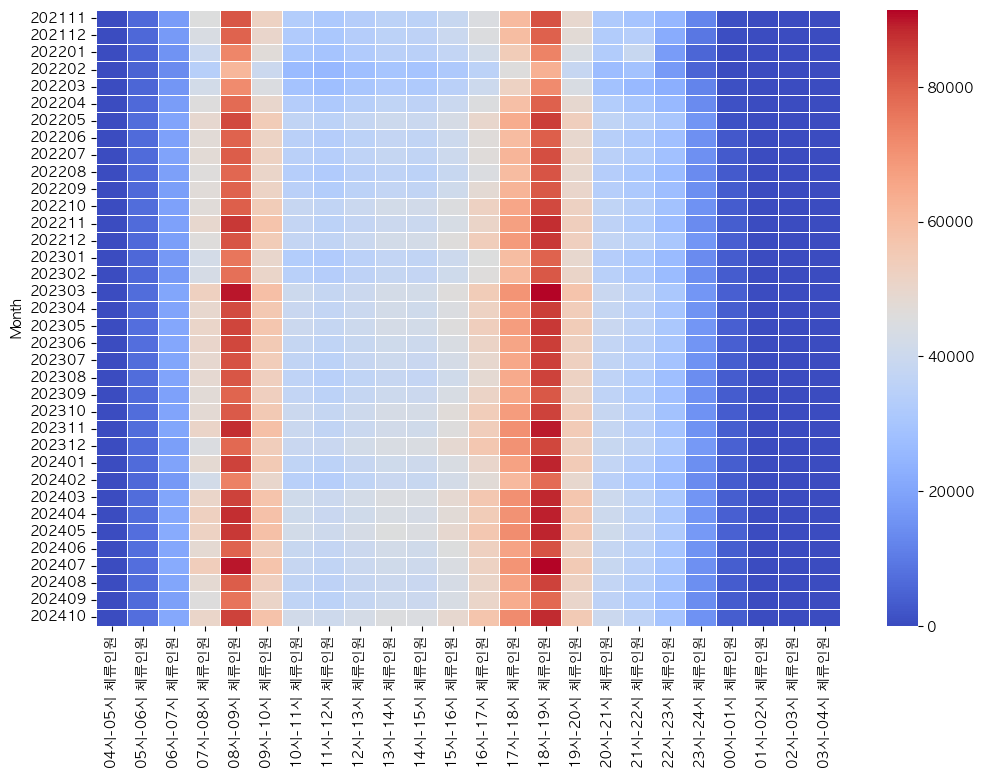

In [18]:
# heatmap 으로 시각화

plt.figure(figsize=(12,8))
sns.heatmap(monthly_pass_mean, cmap='coolwarm', linewidths=0.5)
plt.show()

### Analyze Note

- 07시 ~ 10시 & 17시 ~ 20시 를 하루 중 피크시간으로 판단 할 수 있음 
    - 그 중에서도 08시 ~ 09시 & 18시 ~ 19시가 가장 유동인구가 많음

## < 피크타임과 다른 시간대의 이동인구 파악 >

In [7]:
# 연간 피크타임과 낮시간의 체류인원 비교

compare_df = origin_df.copy()

compare_df['year'] = pd.to_datetime(compare_df['사용월'], format='%Y%m').dt.year

peak_times = ['07시-08시 체류인원', '08시-09시 체류인원', '09시-10시 체류인원',
              '17시-18시 체류인원', '18시-19시 체류인원', '19시-20시 체류인원']
non_peak_times = [col for col in compare_df.columns if '체류인원' in col and col not in peak_times]

yearly_peak_avg = compare_df.groupby('year')[peak_times].mean().mean(axis=1)
yearly_non_peak_avg = compare_df.groupby('year')[non_peak_times].mean().mean(axis=1)

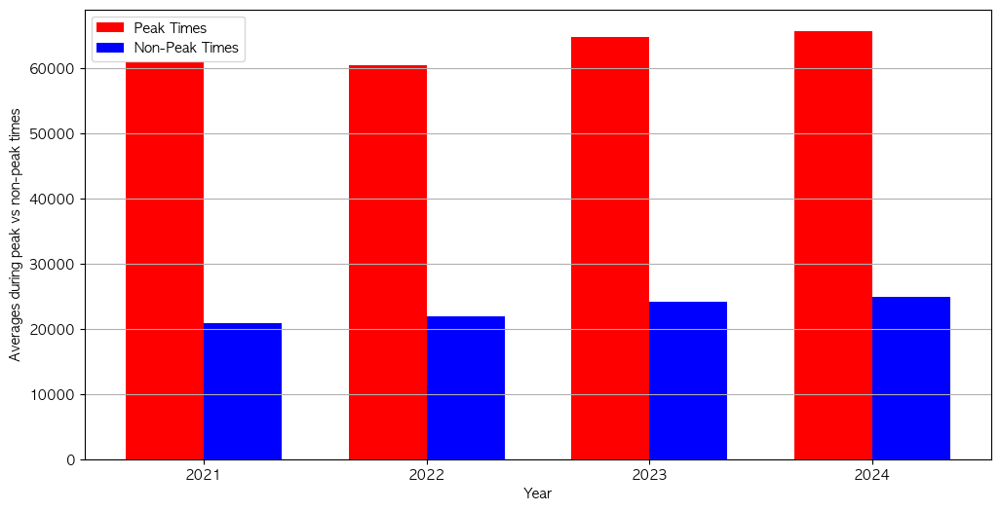

In [8]:
plt.figure(figsize=(12,6))

x = np.arange(len(yearly_peak_avg))
width = 0.35

plt.bar(x - width/2, yearly_peak_avg.values, width, label='Peak Times', color='red')
plt.bar(x + width/2, yearly_non_peak_avg.values, width, label='Non-Peak Times', color='blue')

plt.xlabel('Year')
plt.ylabel('Averages during peak vs non-peak times')
plt.xticks(x, yearly_peak_avg.index)
plt.legend(loc='best')
plt.grid(axis='y')
plt.show()

### Analyze Note

- 피크시간대의 체류인원은 아닌 시간대의 체류인원의 약 3배정도
    - 하루 유동인구의 약 75%의 인원이 피크시간대에 지하철을 이용하는 것을 알 수 있음

In [58]:
# Peak times & Non-Peak times  statistical test

peak_avg = compare_df[peak_times].mean(axis=1)
non_peak_avg = compare_df[non_peak_times].mean(axis=1)

In [59]:
# Variance of Two Groups
peak_avg_var = np.var(peak_avg, ddof=1)
non_peak_avg_var = np.var(non_peak_avg, ddof=1)

# Degrees of Freedom
df1 = len(peak_avg) - 1
df2 = len(non_peak_avg) - 1

# Calculate F-Statistic
f_stat = peak_avg_var / non_peak_avg_var
print(f"F-Statistic: {f_stat}")

# Calculate p-value
p_value = f.sf(f_stat, df1, df2)  # sf: Survival function (1 - cdf)
print(f"P-Value: {p_value}")

F-Statistic: 7.0678350515783555
P-Value: 0.0


<결과 해석>
-	F-statistic: 그룹 간 분산의 비율.
-	p-value: F-statistic이 주어진 자유도에서 나올 확률.
-	p-value > 0.05: 두 그룹의 분산이 유사하다고 볼 수 있음(등분산성 만족).
-	p-value ≤ 0.05: 두 그룹의 분산이 다르다고 볼 수 있음(등분산성 위반).

- 등분산이 아닐 때, welch's t-검정

In [62]:
# Perform Welch's t-Test (Unequal Variance)
t_stat, p_value, df = sm.stats.ttest_ind(peak_avg, non_peak_avg, usevar='unequal')

print(f"T-Statistic: {t_stat}")
print(f"P-Value: {p_value}")
print(f"Degrees of Freedom: {df}")

T-Statistic: 77.817153868764
P-Value: 0.0
Degrees of Freedom: 16683.087342694766


- 서로 다른 두 분포의 비율 차이를 검정할 때!

In [63]:
import statsmodels.stats.weightstats as smw

# Data Example
# data1 = [30, 35, 40, 45, 50]
# data2 = [32, 36, 41, 46, 51]

# Perform z-Test
z_stat, p_value = smw.ztest(peak_avg, non_peak_avg)

print(f"Z-Statistic: {z_stat}")
print(f"P-Value: {p_value}")


Z-Statistic: 77.81715386876397
P-Value: 0.0


## < 환승역과 일반역의 이동인구 파악 >

In [3]:
transfer_df = pd.read_excel('./rawdata/metro_data_add_transfer.xlsx')

In [46]:
# transfer_df['transfer_line' + '체류인원'] 로 새로운 데이터 프레임 만들기  >> 이상치 제거 위해서

new_transfer_df = transfer_df[['transfer_line'] + [col for col in transfer_df.columns if '체류인원' in col]].set_index('transfer_line')
new_transfer_df.head(2)

,04시-05시 체류인원,05시-06시 체류인원,06시-07시 체류인원,07시-08시 체류인원,08시-09시 체류인원,09시-10시 체류인원,10시-11시 체류인원,11시-12시 체류인원,12시-13시 체류인원,13시-14시 체류인원,...,18시-19시 체류인원,19시-20시 체류인원,20시-21시 체류인원,21시-22시 체류인원,22시-23시 체류인원,23시-24시 체류인원,00시-01시 체류인원,01시-02시 체류인원,02시-03시 체류인원,03시-04시 체류인원
transfer_line,,,,,,,,,,,,,,,,,,,,,
1,2,1529,3953,9397,14860,10331,8271,9126,11107,10313,...,11217,9453,5773,4917,4159,2485,28,0,0,0
1,1,1280,3629,9278,13844,9111,7852,8060,9444,9930,...,10614,8862,5897,5278,3839,1983,0,0,0,0


In [47]:
# transfer_df['체류인원'] 의 이상치 값 제거 후 다시 해보기

def remove_outlier(new_transfer_df):
    q1 = new_transfer_df.quantile(0.25)
    q3 = new_transfer_df.quantile(0.75)
    iqr = q3 - q1

    condition1 = new_transfer_df >= q1 - 1.5 * iqr
    condition2 = new_transfer_df <= q3 + 1.5 * iqr
    
    filtered_df = new_transfer_df[condition1 & condition2]
    return filtered_df

filtered_df = remove_outlier(new_transfer_df)
filtered_df

,04시-05시 체류인원,05시-06시 체류인원,06시-07시 체류인원,07시-08시 체류인원,08시-09시 체류인원,09시-10시 체류인원,10시-11시 체류인원,11시-12시 체류인원,12시-13시 체류인원,13시-14시 체류인원,...,18시-19시 체류인원,19시-20시 체류인원,20시-21시 체류인원,21시-22시 체류인원,22시-23시 체류인원,23시-24시 체류인원,00시-01시 체류인원,01시-02시 체류인원,02시-03시 체류인원,03시-04시 체류인원
transfer_line,,,,,,,,,,,,,,,,,,,,,
1,2.0,1529.0,3953.0,9397.0,14860.0,10331.0,8271.0,9126.0,11107.0,10313.0,...,11217.0,9453.0,5773.0,4917.0,4159.0,2485.0,28.0,0.0,0.0,0.0
1,1.0,1280.0,3629.0,9278.0,13844.0,9111.0,7852.0,8060.0,9444.0,9930.0,...,10614.0,8862.0,5897.0,5278.0,3839.0,1983.0,0.0,0.0,0.0,0.0
1,5.0,1114.0,3198.0,8449.0,12542.0,8418.0,7600.0,7827.0,8897.0,9404.0,...,9469.0,8357.0,5466.0,5723.0,3547.0,1467.0,0.0,0.0,0.0,0.0
1,0.0,985.0,2676.0,7477.0,10847.0,7613.0,6705.0,6886.0,7943.0,8422.0,...,8682.0,7466.0,4861.0,4527.0,3201.0,1428.0,0.0,0.0,0.0,0.0
1,0.0,1303.0,3549.0,9148.0,16351.0,9295.0,10655.0,11035.0,11863.0,11337.0,...,12339.0,9528.0,5956.0,4907.0,3900.0,2421.0,41.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1,4.0,4875.0,11725.0,30829.0,46139.0,32187.0,29032.0,27402.0,29936.0,29800.0,...,45856.0,30451.0,23989.0,22119.0,20973.0,12029.0,3589.0,33.0,NaN,0.0
1,0.0,4896.0,12540.0,33425.0,47184.0,31584.0,24387.0,24071.0,27435.0,27882.0,...,43499.0,29759.0,22140.0,19707.0,18583.0,9695.0,3379.0,25.0,0.0,0.0
1,5.0,4482.0,11600.0,30151.0,42563.0,28470.0,22957.0,22314.0,24334.0,24551.0,...,42967.0,28325.0,21443.0,18406.0,17750.0,9208.0,2947.0,27.0,0.0,0.0


In [90]:
# 환승 노선 갯수별 체류인원 평균 & transfer_line set index

by_transfer_lines = new_transfer_df.groupby('transfer_line').mean(numeric_only=True).reset_index()

avg_by_transfer_lines = by_transfer_lines[['transfer_line'] + [col for col in new_transfer_df.columns if '체류인원' in col]]

avg_by_transfer_lines


,transfer_line,04시-05시 체류인원,05시-06시 체류인원,06시-07시 체류인원,07시-08시 체류인원,08시-09시 체류인원,09시-10시 체류인원,10시-11시 체류인원,11시-12시 체류인원,12시-13시 체류인원,...,18시-19시 체류인원,19시-20시 체류인원,20시-21시 체류인원,21시-22시 체류인원,22시-23시 체류인원,23시-24시 체류인원,00시-01시 체류인원,01시-02시 체류인원,02시-03시 체류인원,03시-04시 체류인원
0,1,125.303198,6996.369974,19810.457794,49818.987303,82387.065366,52898.390548,35620.224665,33451.422290,35729.819422,...,80049.948154,50401.393134,34258.244533,31560.482953,26212.508347,13567.917940,3031.191747,94.066306,1.265577,0.136962
1,2,102.875891,6047.070962,17870.435273,44368.275238,81371.121734,54891.559086,36993.131829,36007.692399,38303.087886,...,88801.473278,52775.507720,38014.414489,36456.143705,29953.107185,15158.385095,3197.361936,105.668943,1.902910,0.059086
2,3,231.416043,5829.251337,18086.820321,38993.132620,69247.979679,55303.455615,46388.956150,50365.900535,54805.952941,...,95760.346524,62521.672727,47712.047059,44421.296257,34701.722995,17275.173262,3116.487701,103.882353,2.909091,0.175401
3,4,278.523810,4204.964286,10883.694444,31163.761905,62840.861111,36374.444444,24117.154762,24750.738095,26930.000000,...,71443.079365,40046.599206,29395.230159,29597.972222,25516.349206,13758.841270,3327.071429,65.448413,2.785714,0.305556


In [91]:
avg_by_transfer_lines['transfer_line'].unique()

array([1, 2, 3, 4])

In [100]:
avg_by_transfer_lines['transfer_line'] = avg_by_transfer_lines['transfer_line'].replace({1:'1', 2:'2', 3:'3', 4:'3'})
avg_by_transfer_lines

,transfer_line,04시-05시 체류인원,05시-06시 체류인원,06시-07시 체류인원,07시-08시 체류인원,08시-09시 체류인원,09시-10시 체류인원,10시-11시 체류인원,11시-12시 체류인원,12시-13시 체류인원,...,18시-19시 체류인원,19시-20시 체류인원,20시-21시 체류인원,21시-22시 체류인원,22시-23시 체류인원,23시-24시 체류인원,00시-01시 체류인원,01시-02시 체류인원,02시-03시 체류인원,03시-04시 체류인원
0,1,125.303198,6996.369974,19810.457794,49818.987303,82387.065366,52898.390548,35620.224665,33451.422290,35729.819422,...,80049.948154,50401.393134,34258.244533,31560.482953,26212.508347,13567.917940,3031.191747,94.066306,1.265577,0.136962
1,2,102.875891,6047.070962,17870.435273,44368.275238,81371.121734,54891.559086,36993.131829,36007.692399,38303.087886,...,88801.473278,52775.507720,38014.414489,36456.143705,29953.107185,15158.385095,3197.361936,105.668943,1.902910,0.059086
2,3&4,254.969926,5017.107811,14485.257383,35078.447263,66044.420395,45838.950030,35253.055456,37558.319315,40867.976471,...,83601.712945,51284.135967,38553.638609,37009.634239,30109.036101,15517.007266,3221.779565,84.665383,2.847403,0.240478


In [117]:
peak_times = ['07시-08시 체류인원', '08시-09시 체류인원', '09시-10시 체류인원',
              '17시-18시 체류인원', '18시-19시 체류인원', '19시-20시 체류인원']
non_peak_times = [col for col in avg_by_transfer_lines.columns if '체류인원' in col and col not in peak_times]

peak_avg = avg_by_transfer_lines.groupby('transfer_line')[peak_times].mean().mean(axis=1)
non_peak_avg = avg_by_transfer_lines.groupby('transfer_line')[non_peak_times].mean().mean(axis=1)

peak_df = pd.DataFrame({'peak_time_avg' : peak_avg,
                        'non_peak_time_avg' : non_peak_avg})
                        
peak_df = peak_df.reset_index()
peak_df

,transfer_line,peak_time_avg,non_peak_time_avg
0,1,62743.387981,22404.104155
1,2,65106.960956,24208.610649
2,3&4,58086.467263,24634.582174


In [73]:

from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm
import pandas as pd
from scipy import stats

In [ ]:
# F 검정
# Variance of Two Groups
peak_avg_var = np.var(peak_avg, ddof=1)
non_peak_avg_var = np.var(non_peak_avg, ddof=1)

# Degrees of Freedom
df1 = len(peak_avg) - 1
df2 = len(non_peak_avg) - 1

# Calculate F-Statistic
f_stat = peak_avg_var / non_peak_avg_var
print(f"F-Statistic: {f_stat}")

# Calculate p-value
p_value = f.sf(f_stat, df1, df2)  # sf: Survival function (1 - cdf)
print(f"P-Value: {p_value}")

F-Statistic: 3.2523579463585026
P-Value: 0.23516364629095907


<결과 해석>
-	F-statistic: 그룹 간 분산의 비율.
-	p-value: F-statistic이 주어진 자유도에서 나올 확률.
-	p-value > 0.05: 두 그룹의 분산이 유사하다고 볼 수 있음(등분산성 만족).
-	p-value ≤ 0.05: 두 그룹의 분산이 다르다고 볼 수 있음(등분산성 위반).

In [ ]:
# 등분산 Perform t-Test
t_stat, p_value, df = sm.stats.ttest_ind(peak_avg, non_peak_avg, usevar='pooled')

print(f"T-Statistic: {t_stat}")
print(f"P-Value: {p_value}")
print(f"Degrees of Freedom: {df}")

T-Statistic: 17.5953176553784
P-Value: 6.127288611446932e-05
Degrees of Freedom: 4.0


In [104]:
peak_df['transfer_line'] = pd.Categorical(peak_df['transfer_line']).codes

In [105]:
peak_df.dtypes

transfer_line           int8
peak_time_avg        float64
non_peak_time_avg    float64
dtype: object

In [ ]:
# 분산분석 (ANOVA)
# one-way : 하나의 요인에 따른 세 그룹 간의 평균 차이 비교

# Data Preparation
# data = peak_df

# Perform General ANOVA
print("일반 ANOVA 실행 결과:")
model = ols('transfer_line ~ peak_time_avg', data=peak_df).fit()
anova_table = anova_lm(model)
print(anova_table)

# Perform General ANOVA
print("일반 ANOVA 실행 결과:")
model = ols('transfer_line ~ non_peak_time_avg', data=peak_df).fit()
anova_table = anova_lm(model)
print(anova_table)



일반 ANOVA 실행 결과:
                df    sum_sq   mean_sq         F    PR(>F)
peak_time_avg  1.0  0.849793  0.849793  0.738817  0.547994
Residual       1.0  1.150207  1.150207       NaN       NaN
일반 ANOVA 실행 결과:
                    df    sum_sq   mean_sq         F    PR(>F)
non_peak_time_avg  1.0  1.774109  1.774109  7.853831  0.218198
Residual           1.0  0.225891  0.225891       NaN       NaN


In [118]:
peak_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3 entries, 0 to 2
Data columns (total 3 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   transfer_line      3 non-null      object 
 1   peak_time_avg      3 non-null      float64
 2   non_peak_time_avg  3 non-null      float64
dtypes: float64(2), object(1)
memory usage: 204.0+ bytes


In [119]:
peak_df['transfer_line'] = peak_df['transfer_line'].astype('category')

peak_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3 entries, 0 to 2
Data columns (total 3 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   transfer_line      3 non-null      category
 1   peak_time_avg      3 non-null      float64 
 2   non_peak_time_avg  3 non-null      float64 
dtypes: category(1), float64(2)
memory usage: 315.0 bytes


In [122]:
peak_df = peak_df.groupby('transfer_line').mean().reset_index()
peak_df

/var/folders/bf/2n9rmq1d29n28hv6f6gh6gxw0000gn/T/ipykernel_1960/925331544.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  peak_df = peak_df.groupby('transfer_line').mean().reset_index()


,transfer_line,peak_time_avg,non_peak_time_avg
0,1,62743.387981,22404.104155
1,2,65106.960956,24208.610649
2,3&4,58086.467263,24634.582174


In [123]:
# 피어슨 상관관계수 계산

from scipy.stats import pearsonr

correlation, p_value = pearsonr(peak_df['peak_time_avg'], peak_df['non_peak_time_avg'])

print(f"피어슨 상관계수: {correlation}")
print(f"p-값: {p_value}")

피어슨 상관계수: -0.35906346679752654
p-값: 0.7661923171686109


<결과 해석>
- 피어슨 상관관계 분석 : 변수 간의 상관계수를 계산하여 두 변수 사이의 관계가 얼마나 강하고 어떤 방향으로 나타나는지 평가
-	상관계수 (r) : -1에서 1사이의 값을 가집
    - r=1 : 완벽한 양의 선형관계 (한 변수가 증가하면 다른 변수도 일정 비율로 증기)
    - r=-1 : 완벽한 음의 선형관과 (한 변수가 증가하면 다른 변수는 일정 비율로 감소)
    - r=0 : 선형 관계가 없음 (두 변수 간에 선형적인 상관성이 없음)
        - 0.7 이상 : 강한 양의 상관관계
        - 0.3 ~ 0.7 : 보통 수준의 양의 상관관계
        - 0~ 0.3 : 약한 양의 상관관계
-	p-value < 0.05: 두 그룹이 통계적으로 유의미한 상관관계라고 볼 수 있음
-	p-value >= 0.05: 두 그룹이 통계적으로 유의미한 상관관계라고 볼 수 없음

In [72]:
transfer_df[transfer_df['transfer_line'] == 4 ]['지하철역'].unique()

array(['공덕', '왕십리(성동구청)'], dtype=object)

In [81]:
transfer_df.drop_duplicates(subset=['지하철역'], keep='first')['transfer_line'].value_counts()

transfer_line
1    222
2     48
3      8
4      2
Name: count, dtype: int64

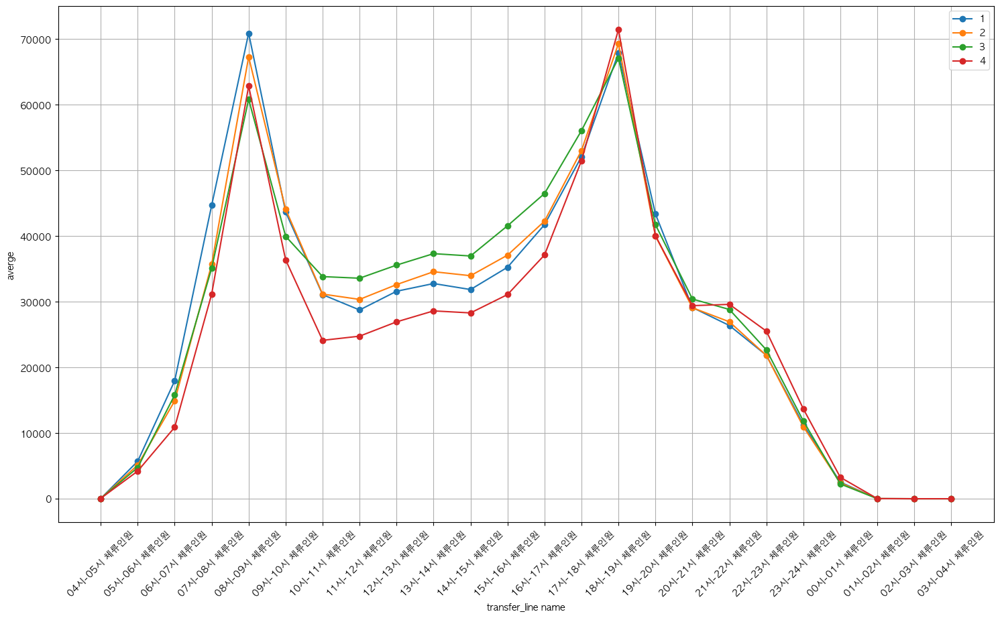

In [29]:
# 환승 노선 갯수별 체류인원 변화 transfer graph

plt.figure(figsize=(18,10))

for transfer_line in avg_by_transfer_lines.index:
    plt.plot([col for col in avg_by_transfer_lines.columns if '체류인원' in col], 
             avg_by_transfer_lines.loc[transfer_line], marker='o', label=str(transfer_line))

plt.xlabel('transfer_line name')
plt.ylabel('averge')
plt.xticks(rotation=45)
plt.grid()
plt.legend(loc='best')

plt.show()

- 대립가설 : 환승역 개수가 증가하면 시간별 체류인원이 증가한다
- 귀무가설 : 환승역 개수는 시간별 체류인원에 영향을 미치지 않는다
    > 분산분석을 하기 전에 이미 시각화를 해서 차트에서 보이는 내용과 분석결과가 크게 다르지 않을 거라서 굳이 분석을 돌려볼 필요가 없음

- 환승역 개수는 승강장 혼잡도에 영향을 미치지 않는다

## < 각 호선별 평균 유동인구 파악 >

In [131]:
lineby_df = origin_df.copy()


In [132]:
# 시간대별 체류인원 (승차인원 + 하차인원) 컬럼 추가

for col in lineby_df.columns :
    if '승차인원' in col :
        exit_col = col.replace('승차인원', '하차인원')
        if exit_col in lineby_df.columns :
            stay_col = col.replace('승차인원', '체류인원')
            lineby_df[stay_col] = lineby_df[col] + lineby_df[exit_col]

lineby_df.head(2)

,사용월,호선명,지하철역,행정구역,transfer_line,대합실면적,승강장면적,월일수,04시-05시 승차인원,04시-05시 하차인원,...,18시-19시 체류인원,19시-20시 체류인원,20시-21시 체류인원,21시-22시 체류인원,22시-23시 체류인원,23시-24시 체류인원,00시-01시 체류인원,01시-02시 체류인원,02시-03시 체류인원,03시-04시 체류인원
0,202111,우이신설선,4.19민주묘지,강북구,1.0,NaN,NaN,30,2,0,...,11217,9453,5773,4917,4159,2485,28,0,0,0
1,202112,우이신설선,4.19민주묘지,강북구,1.0,NaN,NaN,31,0,1,...,10614,8862,5897,5278,3839,1983,0,0,0,0


In [133]:
# lineby_df['호선명' + '체류인원'] 로 새로운 데이터 프레임 만들기  

new_lineby_df = lineby_df[['호선명'] + [col for col in lineby_df.columns if '체류인원' in col]]
new_lineby_df.head(2)

,호선명,04시-05시 체류인원,05시-06시 체류인원,06시-07시 체류인원,07시-08시 체류인원,08시-09시 체류인원,09시-10시 체류인원,10시-11시 체류인원,11시-12시 체류인원,12시-13시 체류인원,...,18시-19시 체류인원,19시-20시 체류인원,20시-21시 체류인원,21시-22시 체류인원,22시-23시 체류인원,23시-24시 체류인원,00시-01시 체류인원,01시-02시 체류인원,02시-03시 체류인원,03시-04시 체류인원
0,우이신설선,2,1529,3953,9397,14860,10331,8271,9126,11107,...,11217,9453,5773,4917,4159,2485,28,0,0,0
1,우이신설선,1,1280,3629,9278,13844,9111,7852,8060,9444,...,10614,8862,5897,5278,3839,1983,0,0,0,0


In [134]:
# '호선명' rename (> line_name) 후 line_name 별 평균 계산

new_lineby_df.rename(columns={'호선명' :'line_name'}, inplace=True)
new_lineby_df.head(2)

/var/folders/bf/2n9rmq1d29n28hv6f6gh6gxw0000gn/T/ipykernel_1960/3440632987.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_lineby_df.rename(columns={'호선명' :'line_name'}, inplace=True)


,line_name,04시-05시 체류인원,05시-06시 체류인원,06시-07시 체류인원,07시-08시 체류인원,08시-09시 체류인원,09시-10시 체류인원,10시-11시 체류인원,11시-12시 체류인원,12시-13시 체류인원,...,18시-19시 체류인원,19시-20시 체류인원,20시-21시 체류인원,21시-22시 체류인원,22시-23시 체류인원,23시-24시 체류인원,00시-01시 체류인원,01시-02시 체류인원,02시-03시 체류인원,03시-04시 체류인원
0,우이신설선,2,1529,3953,9397,14860,10331,8271,9126,11107,...,11217,9453,5773,4917,4159,2485,28,0,0,0
1,우이신설선,1,1280,3629,9278,13844,9111,7852,8060,9444,...,10614,8862,5897,5278,3839,1983,0,0,0,0


In [137]:
line_avg = new_lineby_df.groupby('line_name')[[col for col in lineby_df.columns if '체류인원' in col]].mean().reset_index()
line_avg

,line_name,04시-05시 체류인원,05시-06시 체류인원,06시-07시 체류인원,07시-08시 체류인원,08시-09시 체류인원,09시-10시 체류인원,10시-11시 체류인원,11시-12시 체류인원,12시-13시 체류인원,...,18시-19시 체류인원,19시-20시 체류인원,20시-21시 체류인원,21시-22시 체류인원,22시-23시 체류인원,23시-24시 체류인원,00시-01시 체류인원,01시-02시 체류인원,02시-03시 체류인원,03시-04시 체류인원
0,1호선,377.741667,9303.222222,24625.533333,58661.980556,122902.916667,85246.500000,66403.477778,75065.894444,81420.588889,...,130623.480556,68870.586111,50576.958333,48286.752778,34080.738889,16125.380556,2385.902778,96.941667,2.461111,0.000000
1,2호선,317.628157,12622.428030,35238.319444,88971.334596,173224.400253,122202.588384,77254.926768,72001.881944,77517.227273,...,190005.578283,117018.107955,83995.377525,81799.708333,68586.707071,35469.926768,7658.415404,328.952020,6.434343,0.648359
2,3호선,65.786765,5380.632353,20393.924020,50000.133987,81454.564542,58748.388072,43248.763072,41436.202614,43247.296569,...,88197.211601,54225.139706,38604.820261,34018.302288,27109.700163,12270.030229,2543.738562,66.678922,1.485294,0.260621
3,4호선,168.550214,8762.869658,27172.026709,62776.039530,95857.675214,68349.808761,53062.996795,53053.706197,56468.195513,...,107541.482906,71022.138889,50780.899573,46833.927350,38929.802350,20650.300214,4150.053419,190.835470,1.439103,0.023504
4,5호선,29.178419,5918.794872,17685.600962,47042.686432,75268.659722,40104.569444,27672.678953,27322.935363,29272.725427,...,71775.848825,41748.151709,28518.347222,26378.748932,21545.266026,10917.689637,2636.275107,73.069979,2.356303,0.107906
5,6호선,58.956553,5081.587607,12540.094017,31116.091880,49025.698006,29866.939459,21578.901709,20845.193732,22613.970085,...,47964.272792,32245.500712,21612.715812,20623.930199,18358.170940,10721.212963,2562.467236,24.963675,0.309829,0.004274
6,7호선,60.027064,8615.204330,21847.556157,52305.606901,87462.238160,57122.143437,35981.102842,32441.302436,34337.294317,...,79491.503383,52358.177267,33854.566306,30584.067659,25153.652909,13570.742896,3432.025710,77.209743,0.244926,0.000000
7,8호선,28.032828,6752.250000,19042.406566,47336.101010,82994.664141,47173.330808,30793.851010,29484.489899,31528.578283,...,77412.648990,46032.131313,31630.898990,28052.169192,22426.818182,10754.520202,2552.954545,119.055556,0.436869,0.000000
8,9호선,32.218889,5297.930000,16134.417778,43829.946667,66418.204444,38579.006667,26670.568889,26417.724444,28463.417778,...,67323.825556,41540.650000,28855.386667,26667.603333,22397.703333,11563.402222,2473.398889,92.211111,0.605556,0.030000
9,9호선2~3단계,3.307692,2621.844017,10337.299145,25240.705128,48257.271368,34485.416667,21249.572650,19116.102564,20531.634615,...,48352.987179,29199.284188,19618.192308,18738.314103,14940.094017,6858.044872,1524.961538,51.803419,0.220085,0.000000


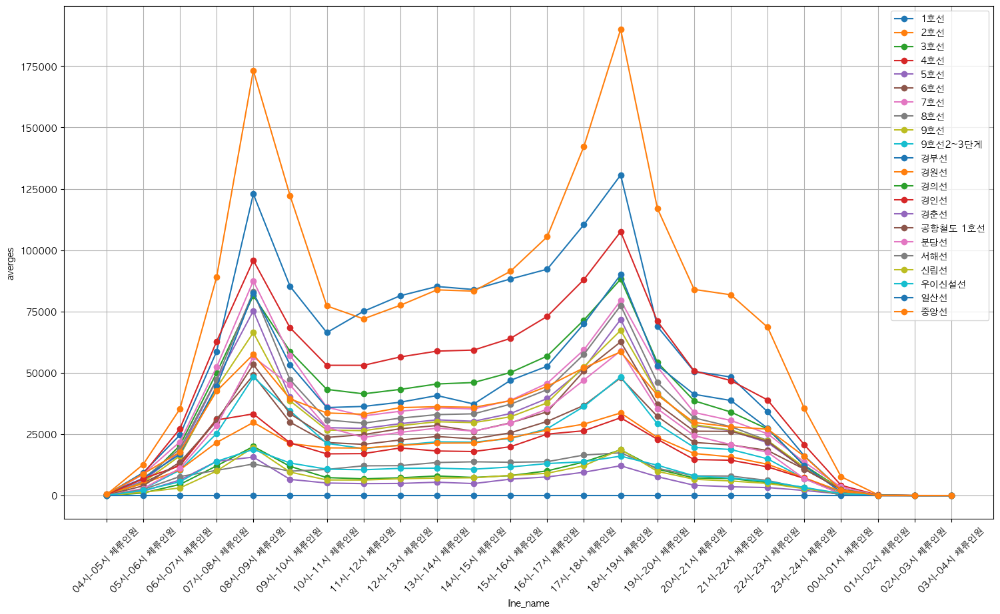

In [144]:
# 노선별 체류인원 변화 lines graph

plt.figure(figsize=(18,10))

for line_name in line_avg['line_name']:
    plt.plot([col for col in line_avg.columns if '체류인원' in col], 
             line_avg.loc[line_avg['line_name'] == line_name, 
                          [col for col in line_avg.columns if '체류인원' in col]].values.flatten(),
               marker='o', label=str(line_name))

plt.xlabel('line_name')
plt.ylabel('averges')
plt.xticks(rotation=45)
plt.grid()
plt.legend(loc='best')

plt.show()

In [185]:
line_total_avg = new_lineby_df.groupby('line_name').mean().mean(axis=1).reset_index()
line_total_avg = line_total_avg.set_index('line_name')
line_total_avg

,0
line_name,
1호선,55628.006597
2호선,72936.572864
3호선,36291.175415
4호선,46205.667646
5호선,27492.861868
6호선,20267.798641
7호선,32649.474233
8호선,29927.282407
9호선,26452.833750


In [187]:
# 노선별 시간대 평균 중 상위 15% 월만 

top_10 = line_total_avg[line_total_avg.max(axis=1) > line_total_avg.quantile(0.80).max()]
top_10 = top_10.loc[top_10.max(axis=1).sort_values(ascending=False).index]
top_10

,0
line_name,
2호선,72936.572864
1호선,55628.006597
4호선,46205.667646
3호선,36291.175415
경부선,34434.495756


### Analyze Note
- 노선별 평균 유동인구는 2호선이 가장 많음 

# <각 호선별 피크타임 유동인구 파악>

In [190]:
# peak & non peak averages by line

peak_times = ['07시-08시 체류인원', '08시-09시 체류인원', '09시-10시 체류인원',
              '17시-18시 체류인원', '18시-19시 체류인원', '19시-20시 체류인원']
non_peak_times = [col for col in line_avg.columns if '체류인원' in col and col not in peak_times]

peak_avg = line_avg.groupby('line_name')[peak_times].mean().mean(axis=1)
non_peak_avg = line_avg.groupby('line_name')[non_peak_times].mean().mean(axis=1)

line_peak_df = pd.DataFrame({'peak_time_avg' : peak_avg,
                        'non_peak_time_avg' : non_peak_avg})
                        
line_peak_df = line_peak_df
line_peak_df

,peak_time_avg,non_peak_time_avg
line_name,,
1호선,96117.218981,42131.602469
2호선,138954.055871,50930.745195
3호선,67359.488154,25935.071169
4호선,82261.403312,34187.089091
5호선,54643.184918,18442.754184
6호선,37826.130817,14415.021249
7호선,64685.196549,21970.900128
8호선,59747.861532,19987.089366
9호선,51700.812037,18036.840988


In [205]:
line_peak_df.sort_values(by='peak_time_avg', ascending=False)

,peak_time_avg,non_peak_time_avg
line_name,,
2호선,138954.055871,50930.745195
1호선,96117.218981,42131.602469
4호선,82261.403312,34187.089091
3호선,67359.488154,25935.071169
경부선,65555.562500,24060.806842
7호선,64685.196549,21970.900128
8호선,59747.861532,19987.089366
5호선,54643.184918,18442.754184
9호선,51700.812037,18036.840988


In [200]:
# 노선별 peak 시간대 평균 중 상위 15% 월만 

top_10 = line_peak_df[line_peak_df['peak_time_avg'] > line_peak_df['peak_time_avg'].quantile(0.80).max()]
top_10 = top_10.loc[top_10.max(axis=1).sort_values(ascending=False).index]
top_10

,peak_time_avg,non_peak_time_avg
line_name,,
2호선,138954.055871,50930.745195
1호선,96117.218981,42131.602469
4호선,82261.403312,34187.089091
3호선,67359.488154,25935.071169
경부선,65555.562500,24060.806842


In [201]:
# 노선별 non_peak 시간대 평균 중 상위 15% 월만 

top_10 = line_peak_df[line_peak_df['non_peak_time_avg'] > line_peak_df['non_peak_time_avg'].quantile(0.80).max()]
top_10 = top_10.loc[top_10.max(axis=1).sort_values(ascending=False).index]
top_10

,peak_time_avg,non_peak_time_avg
line_name,,
2호선,138954.055871,50930.745195
1호선,96117.218981,42131.602469
4호선,82261.403312,34187.089091
3호선,67359.488154,25935.071169
경부선,65555.562500,24060.806842


### Analyze Note
- 노선별 피크시간 평균 & 아닌시간의 평균 유동인구는 노선별 전체 평균이랑 다르지 않음
- 시간이 아닌 노선에 따라 혼잡도의 차이가 있는 걸 알 수 있음


# < 혼잡도 상위 10개 역의 공통점 파악 >

In [9]:
congestion_df = origin_df.copy()
congestion_df.head(2)

,사용월,호선명,지하철역,행정구역,transfer_line,대합실면적,승강장면적,월일수,04시-05시 승차인원,04시-05시 하차인원,...,23시-24시 하차인원,00시-01시 승차인원,00시-01시 하차인원,01시-02시 승차인원,01시-02시 하차인원,02시-03시 승차인원,02시-03시 하차인원,03시-04시 승차인원,03시-04시 하차인원,작업일자
0,202111,우이신설선,4.19민주묘지,강북구,1.0,NaN,NaN,30,2,0,...,2179,0,28,0,0,0,0,0,0,20211203
1,202112,우이신설선,4.19민주묘지,강북구,1.0,NaN,NaN,31,0,1,...,1720,0,0,0,0,0,0,0,0,20220103


In [10]:
# 시간대별 체류인원 (승차인원 + 하차인원) 컬럼 추가

for col in congestion_df.columns :
    if '승차인원' in col :
        exit_col = col.replace('승차인원', '하차인원')
        if exit_col in congestion_df.columns :
            stay_col = col.replace('승차인원', '체류인원')
            congestion_df[stay_col] = congestion_df[col] + congestion_df[exit_col]

congestion_df.head(2)

,사용월,호선명,지하철역,행정구역,transfer_line,대합실면적,승강장면적,월일수,04시-05시 승차인원,04시-05시 하차인원,...,18시-19시 체류인원,19시-20시 체류인원,20시-21시 체류인원,21시-22시 체류인원,22시-23시 체류인원,23시-24시 체류인원,00시-01시 체류인원,01시-02시 체류인원,02시-03시 체류인원,03시-04시 체류인원
0,202111,우이신설선,4.19민주묘지,강북구,1.0,NaN,NaN,30,2,0,...,11217,9453,5773,4917,4159,2485,28,0,0,0
1,202112,우이신설선,4.19민주묘지,강북구,1.0,NaN,NaN,31,0,1,...,10614,8862,5897,5278,3839,1983,0,0,0,0


In [11]:
# congestion_df ['호선명' + '지하철역' + '체류인원'] 로 새로운 데이터 프레임 만들기  

station_df = congestion_df [['호선명', '지하철역'] + [col for col in congestion_df .columns if '체류인원' in col]]
station_df.head(2)

,호선명,지하철역,04시-05시 체류인원,05시-06시 체류인원,06시-07시 체류인원,07시-08시 체류인원,08시-09시 체류인원,09시-10시 체류인원,10시-11시 체류인원,11시-12시 체류인원,...,18시-19시 체류인원,19시-20시 체류인원,20시-21시 체류인원,21시-22시 체류인원,22시-23시 체류인원,23시-24시 체류인원,00시-01시 체류인원,01시-02시 체류인원,02시-03시 체류인원,03시-04시 체류인원
0,우이신설선,4.19민주묘지,2,1529,3953,9397,14860,10331,8271,9126,...,11217,9453,5773,4917,4159,2485,28,0,0,0
1,우이신설선,4.19민주묘지,1,1280,3629,9278,13844,9111,7852,8060,...,10614,8862,5897,5278,3839,1983,0,0,0,0


In [12]:
# '호선명' rename (호선명 > line_name, 지하철역 > subway_staion

station_df.rename(columns={'호선명' :'line_name'}, inplace=True)
station_df.rename(columns={'지하철역' :'subway_station'}, inplace=True)
station_df.head(2)

/var/folders/bf/2n9rmq1d29n28hv6f6gh6gxw0000gn/T/ipykernel_2704/772471611.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_df.rename(columns={'호선명' :'line_name'}, inplace=True)
/var/folders/bf/2n9rmq1d29n28hv6f6gh6gxw0000gn/T/ipykernel_2704/772471611.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_df.rename(columns={'지하철역' :'subway_station'}, inplace=True)


,line_name,subway_station,04시-05시 체류인원,05시-06시 체류인원,06시-07시 체류인원,07시-08시 체류인원,08시-09시 체류인원,09시-10시 체류인원,10시-11시 체류인원,11시-12시 체류인원,...,18시-19시 체류인원,19시-20시 체류인원,20시-21시 체류인원,21시-22시 체류인원,22시-23시 체류인원,23시-24시 체류인원,00시-01시 체류인원,01시-02시 체류인원,02시-03시 체류인원,03시-04시 체류인원
0,우이신설선,4.19민주묘지,2,1529,3953,9397,14860,10331,8271,9126,...,11217,9453,5773,4917,4159,2485,28,0,0,0
1,우이신설선,4.19민주묘지,1,1280,3629,9278,13844,9111,7852,8060,...,10614,8862,5897,5278,3839,1983,0,0,0,0


In [13]:
sation_avg = station_df.groupby(['line_name', 'subway_station'])[[col for col in station_df.columns if '체류인원' in col]].mean().reset_index()
sation_avg

,line_name,subway_station,04시-05시 체류인원,05시-06시 체류인원,06시-07시 체류인원,07시-08시 체류인원,08시-09시 체류인원,09시-10시 체류인원,10시-11시 체류인원,11시-12시 체류인원,...,18시-19시 체류인원,19시-20시 체류인원,20시-21시 체류인원,21시-22시 체류인원,22시-23시 체류인원,23시-24시 체류인원,00시-01시 체류인원,01시-02시 체류인원,02시-03시 체류인원,03시-04시 체류인원
0,1호선,동대문,742.111111,13097.277778,15456.194444,25615.805556,39792.250000,39959.444444,39386.500000,43820.111111,...,44186.666667,36322.750000,28101.833333,25530.972222,21356.777778,13246.333333,2737.888889,184.444444,2.638889,0.0
1,1호선,동묘앞,188.166667,3787.805556,8221.138889,15805.416667,31123.138889,26995.777778,32381.750000,44015.000000,...,32044.194444,17708.916667,11545.166667,10669.055556,9512.944444,5147.916667,1850.555556,237.194444,9.250000,0.0
2,1호선,서울,645.277778,16466.277778,62311.361111,144361.805556,283240.638889,205267.555556,135826.194444,141650.361111,...,299609.527778,171022.388889,122292.638889,120297.055556,79459.861111,36642.777778,4760.194444,244.138889,9.777778,0.0
3,1호선,시청,83.138889,6859.805556,26738.944444,74400.388889,195501.611111,98358.250000,55905.027778,60671.888889,...,178185.888889,71725.361111,60047.250000,55159.694444,34633.583333,12941.333333,1308.333333,64.777778,0.666667,0.0
4,1호선,신설동,374.194444,10882.833333,18232.888889,43056.750000,84507.277778,51821.000000,38488.500000,37852.027778,...,80292.583333,41029.166667,28131.083333,26376.666667,20452.666667,12066.611111,2361.333333,20.166667,0.527778,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
361,일산선,지축,0.000000,0.000000,0.027778,0.444444,1.472222,1.194444,1.277778,1.055556,...,3.027778,1.972222,0.972222,0.555556,0.472222,0.611111,0.083333,0.000000,0.000000,0.0
362,중앙선,망우,389.277778,9058.083333,14811.638889,35665.083333,38035.611111,25309.222222,21946.333333,21258.000000,...,40818.777778,28817.361111,19053.694444,14330.944444,12651.472222,7410.555556,692.444444,0.388889,0.000000,0.0
363,중앙선,상봉,696.400000,7263.700000,11411.200000,27220.000000,31503.500000,19516.600000,14713.100000,14954.600000,...,33681.500000,26177.800000,16824.000000,13615.500000,12601.200000,7100.600000,1337.700000,0.600000,0.000000,0.0
364,중앙선,양평,74.138889,1830.472222,5734.194444,11448.694444,13757.750000,9876.388889,11480.055556,12167.527778,...,13434.277778,8717.500000,8767.500000,5856.250000,4720.222222,3601.055556,851.944444,1.194444,0.000000,0.0


In [14]:
total_avg = sation_avg.groupby(['line_name', 'subway_station']).mean().mean(axis=1).reset_index(name='averages')
total_avg

,line_name,subway_station,averages
0,1호선,동대문,28082.773148
1,1호선,동묘앞,24370.346065
2,1호선,서울,120207.642361
3,1호선,시청,58067.508102
4,1호선,신설동,32229.370370
...,...,...,...
361,일산선,지축,0.972222
362,중앙선,망우,18545.785880
363,중앙선,상봉,14545.712500
364,중앙선,양평,7940.009259


In [52]:
# 노선별 상위 5개 역만  

top_5 = total_avg.groupby('line_name', as_index=False).apply(lambda x: x.nlargest(5, columns='averages')).reset_index(drop=True)
top_5

/var/folders/bf/2n9rmq1d29n28hv6f6gh6gxw0000gn/T/ipykernel_1118/4005742523.py:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  top_5 = total_avg.groupby('line_name', as_index=False).apply(lambda x: x.nlargest(5, columns='averages')).reset_index(drop=True)


,line_name,subway_station,averages
0,1호선,서울,120207.642361
1,1호선,종각,84921.908565
2,1호선,종로3가,59975.100694
3,1호선,시청,58067.508102
4,1호선,종로5가,56265.899306
...,...,...,...
86,일산선,지축,0.972222
87,중앙선,회기,62172.311343
88,중앙선,망우,18545.785880
89,중앙선,상봉,14545.712500


In [16]:
top_5 = top_5.sort_values(by='averages', ascending=False)

In [18]:
top_5_df = top_5.groupby('line_name')['subway_station'].apply(list).reset_index(name='top_station')
top_5_df

,line_name,top_station
0,1호선,"[서울역, 종각, 종로3가, 시청, 종로5가]"
1,2호선,"[강남, 잠실(송파구청), 홍대입구, 신림, 구로디지털단지]"
2,3호선,"[고속터미널, 양재(서초구청), 연신내, 압구정, 남부터미널(예술의전당)]"
3,4호선,"[혜화, 수유(강북구청), 명동, 충무로, 쌍문]"
4,5호선,"[광화문(세종문화회관), 까치산, 여의도, 화곡, 오목교(목동운동장앞)]"
5,6호선,"[공덕, 응암, 망원, 디지털미디어시티, 합정]"
6,7호선,"[가산디지털단지, 학동, 노원, 철산, 광명사거리]"
7,8호선,"[문정, 잠실(송파구청), 암사, 장지, 천호(풍납토성)]"
8,9호선,"[신논현, 여의도, 노량진, 가양, 당산]"
9,9호선2~3단계,"[봉은사, 언주, 중앙보훈병원, 선정릉, 석촌]"


In [17]:
top_10_df = top_5.nlargest(10, 'averages')
top_10_df

,line_name,subway_station,averages
5,2호선,강남,184721.849537
6,2호선,잠실(송파구청),184501.763889
7,2호선,홍대입구,169102.959491
8,2호선,신림,133743.174769
9,2호선,구로디지털단지,131909.238426
0,1호선,서울역,120207.642361
10,3호선,고속터미널,116114.915509
50,경부선,용산,100676.510417
30,7호선,가산디지털단지,93761.417824
11,3호선,양재(서초구청),87906.737269


### Analyze Note
- 역사별 토지 용도 구분
    - 일반상업지역 : 강남, 잠실(송파구청)/3, 신림, 구로디지털단지/3, 서울역/1, 고속터미널, 용산, 양재(서초구청)
    - 일반주거지역 : 잠실(송파구청)/1, 홍대입구/1, 서울역/3
    - 근린상업지역 : 홍대입구/3
    - 준공업지역 : 구로디지털단지/1
    - 국사산업단지 : 가산디지털단지
- 상업(공업)지역에 위치한 역사가 평균 유동인구가 많은 것을 알 수 있음
- 

# < 혼잡도 상위 5개 역의 지리적 위치 파악 >

In [13]:
coordinate_df = pd.read_csv('./rawdata/station_coordinate.csv')
coordinate_df

,line,name,code,lat,lng
0,01호선,녹양,1908.0,37.759380,127.042292
1,01호선,남영,1002.0,37.541021,126.971300
2,01호선,용산,1003.0,37.529849,126.964561
3,01호선,노량진,1004.0,37.514219,126.942454
4,01호선,대방,1005.0,37.513342,126.926382
...,...,...,...,...,...
725,인천선,지식정보단지,3135.0,37.378384,126.645168
726,인천선,인천대입구,3136.0,37.386007,126.639484
727,인천선,센트럴파크,3137.0,37.393054,126.634729
728,인천선,국제업무지구,3138.0,37.399907,126.630347


In [123]:
coordinate_df['line'].unique()

array(['01호선', '02호선', '03호선', '04호선', '05호선', '06호선', '07호선', '08호선',
       '09호선', '경강선', '경의선', '경춘선', '공항철도', '김포도시철도', '분당선', '서해선', '수인선',
       '신분당선', '용인경전철', '우이신설경전철', '의정부경전철', '인천2호선', '인천선'], dtype=object)

In [125]:
total_avg['line_name'].unique()

array(['1호선', '2호선', '3호선', '4호선', '5호선', '6호선', '7호선', '8호선', '9호선',
       '9호선2~3단계', '경부선', '경원선', '경의선', '경인선', '경춘선', '공항철도 1호선', '분당선',
       '서해선', '신림선', '우이신설선', '일산선', '중앙선'], dtype=object)

In [14]:
coordinate_df['line'] = coordinate_df['line'].replace({'01호선' : '1호선','02호선' : '2호선', '03호선' : '3호선',
                              '04호선' : '4호선', '05호선' : '5호선', '06호선' : '6호선',
                               '07호선' : '7호선', '08호선' : '8호선', '09호선' : '9호선',
                                '우이신설경전철' : '우이신설선' })
coordinate_df

,line,name,code,lat,lng
0,1호선,녹양,1908.0,37.759380,127.042292
1,1호선,남영,1002.0,37.541021,126.971300
2,1호선,용산,1003.0,37.529849,126.964561
3,1호선,노량진,1004.0,37.514219,126.942454
4,1호선,대방,1005.0,37.513342,126.926382
...,...,...,...,...,...
725,인천선,지식정보단지,3135.0,37.378384,126.645168
726,인천선,인천대입구,3136.0,37.386007,126.639484
727,인천선,센트럴파크,3137.0,37.393054,126.634729
728,인천선,국제업무지구,3138.0,37.399907,126.630347


In [15]:
coordinate_df.rename(columns={'name' :'subway_station', 'line' : 'line_name',
                              'lat' :'latitude', 'lng' : 'longitude'}, inplace=True)
coordinate_df

,line_name,subway_station,code,latitude,longitude
0,1호선,녹양,1908.0,37.759380,127.042292
1,1호선,남영,1002.0,37.541021,126.971300
2,1호선,용산,1003.0,37.529849,126.964561
3,1호선,노량진,1004.0,37.514219,126.942454
4,1호선,대방,1005.0,37.513342,126.926382
...,...,...,...,...,...
725,인천선,지식정보단지,3135.0,37.378384,126.645168
726,인천선,인천대입구,3136.0,37.386007,126.639484
727,인천선,센트럴파크,3137.0,37.393054,126.634729
728,인천선,국제업무지구,3138.0,37.399907,126.630347


In [24]:
merged_df = pd.merge(total_avg, coordinate_df, on=['line_name','subway_station'], how='left')
merged_df

,line_name,subway_station,averages,code,latitude,longitude
0,1호선,동대문,28082.773148,155.0,37.571420,127.009745
1,1호선,동묘앞,24370.346065,159.0,37.572627,127.016429
2,1호선,서울,120207.642361,150.0,37.554648,126.972559
3,1호선,시청,58067.508102,151.0,37.564718,126.977108
4,1호선,신설동,32229.370370,156.0,37.575297,127.025087
...,...,...,...,...,...,...
361,일산선,지축,0.972222,NaN,NaN,NaN
362,중앙선,망우,18545.785880,NaN,NaN,NaN
363,중앙선,상봉,14545.712500,NaN,NaN,NaN
364,중앙선,양평,7940.009259,NaN,NaN,NaN


In [134]:
filterd_merged_df = merged_df.dropna(subset=['latitude', 'longitude'])

In [135]:
# 노선별 상위 5개 역만  

merged_top_5 = filterd_merged_df.groupby('line_name', as_index=False).apply(lambda x: x.nlargest(5, columns='averages')).reset_index(drop=True)
merged_top_5

/var/folders/bf/2n9rmq1d29n28hv6f6gh6gxw0000gn/T/ipykernel_1118/3328244484.py:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  merged_top_5 = filterd_merged_df.groupby('line_name', as_index=False).apply(lambda x: x.nlargest(5, columns='averages')).reset_index(drop=True)


,line_name,subway_station,averages,code,latitude,longitude
0,1호선,서울,120207.642361,150.0,37.554648,126.972559
1,1호선,종각,84921.908565,152.0,37.570161,126.982923
2,1호선,종로3가,59975.100694,153.0,37.571607,126.991806
3,1호선,시청,58067.508102,151.0,37.564718,126.977108
4,1호선,종로5가,56265.899306,154.0,37.570926,127.001849
...,...,...,...,...,...,...
56,우이신설선,북한산보국문,14695.178241,4709.0,37.612343,127.008009
57,우이신설선,솔샘,13370.571759,4708.0,37.621240,127.013528
58,우이신설선,정릉,10923.167824,4710.0,37.602798,127.013490
59,우이신설선,가오리,10047.913194,4704.0,37.641701,127.016792


In [183]:
merged_top_5_df = merged_top_5.groupby('line_name')['subway_station'].apply(list).reset_index(name='top_station')
merged_top_5_df

,line_name,top_station
0,1호선,"[서울, 종각, 종로3가, 시청, 종로5가]"
1,2호선,"[강남, 잠실, 홍대입구, 신림, 구로디지털단지]"
2,3호선,"[고속터미널, 양재, 연신내, 압구정, 남부터미널]"
3,4호선,"[혜화, 수유, 명동, 충무로, 쌍문]"
4,5호선,"[광화문, 까치산, 여의도, 화곡, 오목교]"
5,6호선,"[공덕, 응암, 망원, 디지털미디어시티, 합정]"
6,7호선,"[가산디지털단지, 학동, 노원, 철산, 광명사거리]"
7,8호선,"[문정, 잠실, 암사, 장지, 천호]"
8,9호선,"[신논현, 여의도, 노량진, 가양, 당산]"
9,경의선,"[가좌, 서울, 공덕, 효창공원앞, 디지털미디어시티]"


In [57]:
import pandas as pd
import re
import folium
import json

In [167]:
# 기본 지도 생성
new_seoul_map = folium.Map(location=[37.541, 126.986], zoom_start=11)

# 각 역의 위치를 지도에 추가
for idx, row in filterd_merged_df.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=row['subway_station']
    ).add_to(new_seoul_map)

new_seoul_map

# 지도 저장 또는 표시
# new_seoul_map.save("seoul_subway_map.html")

In [193]:
# 서울시 중심 좌표 설정
seoul_center = [37.5665, 126.9780]
# 지도 생성
new_seoul_map2 = folium.Map(location=seoul_center, zoom_start=11)
# GeoJSON 파일 경로 (서울시 행정구역 경계 데이터)
geojson_path = '/Users/na/Downloads/codeit/프로젝트/서울_자치구_경계_2017.geojson'
# GeoJSON 파일 로드
with open(geojson_path, encoding='utf-8') as f:
    seoul_geo = json.load(f)
# 행정구역 경계선을 지도에 추가
folium.GeoJson(
    seoul_geo,
    name="서울시 행정구역",
    style_function=lambda x: {
        'fillColor': 'white',  # 채우기 색상 (투명)
        'color': 'blue',       # 경계선 색상
        'weight': 2            # 경계선 두께
    }
).add_to(new_seoul_map2)
new_seoul_map2

In [136]:
merged_top_5

,line_name,subway_station,averages,code,latitude,longitude
0,1호선,서울,120207.642361,150.0,37.554648,126.972559
1,1호선,종각,84921.908565,152.0,37.570161,126.982923
2,1호선,종로3가,59975.100694,153.0,37.571607,126.991806
3,1호선,시청,58067.508102,151.0,37.564718,126.977108
4,1호선,종로5가,56265.899306,154.0,37.570926,127.001849
...,...,...,...,...,...,...
56,우이신설선,북한산보국문,14695.178241,4709.0,37.612343,127.008009
57,우이신설선,솔샘,13370.571759,4708.0,37.621240,127.013528
58,우이신설선,정릉,10923.167824,4710.0,37.602798,127.013490
59,우이신설선,가오리,10047.913194,4704.0,37.641701,127.016792


In [172]:
merged_top_5['averages'].describe()

count        61.000000
mean      58960.895473
std       40995.677373
min        5267.325231
25%       36046.951389
50%       51287.415509
75%       73480.204861
max      184721.849537
Name: averages, dtype: float64

In [197]:
map_top5_byline = new_seoul_map2

# 지하철역 위경도에 혼잡도에 비례하는 반경을 표시하여 지도에 추가
merged_top_5 = pd.DataFrame(merged_top_5)

for idx, row in merged_top_5.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=row['averages'] / 10000,  # 혼잡도에 따른 크기 조정
        
        fill=True,
        fill_color='red',
        fill_opacity=0.6,
        popup=f"역 이름: {row['subway_station']}<br>노선: {row['line_name']}<br>혼잡도 평균: {row['averages']}",
        max_width=300
    ).add_to(map_top5_byline)

map_top5_byline

In [184]:
top_10_df = merged_top_5.nlargest(10, 'averages')
top_10_df

,line_name,subway_station,averages,code,latitude,longitude
5,2호선,강남,184721.849537,222.0,37.497175,127.027926
6,2호선,잠실,184501.763889,216.0,37.513950,127.102234
7,2호선,홍대입구,169102.959491,239.0,37.557192,126.925381
8,2호선,신림,133743.174769,230.0,37.484201,126.929715
9,2호선,구로디지털단지,131909.238426,232.0,37.485266,126.901401
0,1호선,서울,120207.642361,150.0,37.554648,126.972559
10,3호선,고속터미널,116114.915509,329.0,37.504810,127.004943
30,7호선,가산디지털단지,93761.417824,2748.0,37.481072,126.882343
11,3호선,양재,87906.737269,332.0,37.484147,127.034631
15,4호선,혜화,86089.556713,420.0,37.582336,127.001844


In [ ]:
# 지하철역 위경도에 혼잡도에 비례하는 반경을 표시하여 지도에 추가
map_top10_total = new_seoul_map2
map_top10_total

In [195]:
top_10_df = pd.DataFrame(top_10_df)

for idx, row in top_10_df.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=row['averages'] / 10000,  # 혼잡도에 따른 크기 조정
        
        fill=True,
        fill_color='red',
        fill_opacity=0.6,
        popup=f"역 이름: {row['subway_station']}<br>노선: {row['line_name']}<br>혼잡도 평균: {row['averages']}",
        max_width=300
    ).add_to(map_top10_total)

map_top10_total

### Analyze Note
- 서울시 주요 상업지구가 가장 유동인구가 많은 것으로 확인
- 상업지구가 많은 강남지역이 강북지역보다 유동인구가 많음

# < 혼잡도 하위 5개 역의 지리적 위치 파악 >

In [3]:
coordinate_df = pd.read_csv('./rawdata/station_coordinate.csv')
coordinate_df

,line,name,code,lat,lng
0,01호선,녹양,1908.0,37.759380,127.042292
1,01호선,남영,1002.0,37.541021,126.971300
2,01호선,용산,1003.0,37.529849,126.964561
3,01호선,노량진,1004.0,37.514219,126.942454
4,01호선,대방,1005.0,37.513342,126.926382
...,...,...,...,...,...
725,인천선,지식정보단지,3135.0,37.378384,126.645168
726,인천선,인천대입구,3136.0,37.386007,126.639484
727,인천선,센트럴파크,3137.0,37.393054,126.634729
728,인천선,국제업무지구,3138.0,37.399907,126.630347


In [ ]:
coordinate_df['line'].unique()

array(['01호선', '02호선', '03호선', '04호선', '05호선', '06호선', '07호선', '08호선',
       '09호선', '경강선', '경의선', '경춘선', '공항철도', '김포도시철도', '분당선', '서해선', '수인선',
       '신분당선', '용인경전철', '우이신설경전철', '의정부경전철', '인천2호선', '인천선'], dtype=object)

In [ ]:
total_avg['line_name'].unique()

array(['1호선', '2호선', '3호선', '4호선', '5호선', '6호선', '7호선', '8호선', '9호선',
       '9호선2~3단계', '경부선', '경원선', '경의선', '경인선', '경춘선', '공항철도 1호선', '분당선',
       '서해선', '신림선', '우이신설선', '일산선', '중앙선'], dtype=object)

In [4]:
coordinate_df['line'] = coordinate_df['line'].replace({'01호선' : '1호선','02호선' : '2호선', '03호선' : '3호선',
                              '04호선' : '4호선', '05호선' : '5호선', '06호선' : '6호선',
                               '07호선' : '7호선', '08호선' : '8호선', '09호선' : '9호선',
                                '우이신설경전철' : '우이신설선' })
coordinate_df

,line,name,code,lat,lng
0,1호선,녹양,1908.0,37.759380,127.042292
1,1호선,남영,1002.0,37.541021,126.971300
2,1호선,용산,1003.0,37.529849,126.964561
3,1호선,노량진,1004.0,37.514219,126.942454
4,1호선,대방,1005.0,37.513342,126.926382
...,...,...,...,...,...
725,인천선,지식정보단지,3135.0,37.378384,126.645168
726,인천선,인천대입구,3136.0,37.386007,126.639484
727,인천선,센트럴파크,3137.0,37.393054,126.634729
728,인천선,국제업무지구,3138.0,37.399907,126.630347


In [5]:
coordinate_df.rename(columns={'name' :'subway_station', 'line' : 'line_name',
                              'lat' :'latitude', 'lng' : 'longitude'}, inplace=True)
coordinate_df

,line_name,subway_station,code,latitude,longitude
0,1호선,녹양,1908.0,37.759380,127.042292
1,1호선,남영,1002.0,37.541021,126.971300
2,1호선,용산,1003.0,37.529849,126.964561
3,1호선,노량진,1004.0,37.514219,126.942454
4,1호선,대방,1005.0,37.513342,126.926382
...,...,...,...,...,...
725,인천선,지식정보단지,3135.0,37.378384,126.645168
726,인천선,인천대입구,3136.0,37.386007,126.639484
727,인천선,센트럴파크,3137.0,37.393054,126.634729
728,인천선,국제업무지구,3138.0,37.399907,126.630347


In [15]:
merged_df = pd.merge(total_avg, coordinate_df, on=['line_name','subway_station'], how='left')
merged_df

,line_name,subway_station,averages,code,latitude,longitude
0,1호선,동대문,28082.773148,155.0,37.571420,127.009745
1,1호선,동묘앞,24370.346065,159.0,37.572627,127.016429
2,1호선,서울,120207.642361,150.0,37.554648,126.972559
3,1호선,시청,58067.508102,151.0,37.564718,126.977108
4,1호선,신설동,32229.370370,156.0,37.575297,127.025087
...,...,...,...,...,...,...
361,일산선,지축,0.972222,NaN,NaN,NaN
362,중앙선,망우,18545.785880,NaN,NaN,NaN
363,중앙선,상봉,14545.712500,NaN,NaN,NaN
364,중앙선,양평,7940.009259,NaN,NaN,NaN


In [16]:
filterd_merged_df = merged_df.dropna(subset=['latitude', 'longitude'])

In [17]:
# 노선별 상위 5개 역만  

merged_bottom_5_df = filterd_merged_df.groupby('line_name', as_index=False).apply(lambda x: x.nsmallest(5, columns='averages')).reset_index(drop=True)
merged_bottom_5_df

/var/folders/bf/2n9rmq1d29n28hv6f6gh6gxw0000gn/T/ipykernel_2704/3399048265.py:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  merged_bottom_5_df = filterd_merged_df.groupby('line_name', as_index=False).apply(lambda x: x.nsmallest(5, columns='averages')).reset_index(drop=True)


,line_name,subway_station,averages,code,latitude,longitude
0,1호선,동묘앞,24370.346065,159.0,37.572627,127.016429
1,1호선,동대문,28082.773148,155.0,37.571420,127.009745
2,1호선,신설동,32229.370370,156.0,37.575297,127.025087
3,1호선,제기동,41431.924769,157.0,37.578103,127.034893
4,1호선,청량리,50727.592593,158.0,37.580178,127.046835
...,...,...,...,...,...,...
56,우이신설선,보문,3803.210648,4712.0,37.585286,127.019381
57,우이신설선,삼양,4981.925926,4706.0,37.627165,127.018152
58,우이신설선,신설동,5204.896991,4713.0,37.575297,127.025087
59,우이신설선,솔밭공원,6003.879630,4702.0,37.656088,127.013252


In [18]:
merged_bottom_5 = merged_bottom_5_df.groupby('line_name')['subway_station'].apply(list).reset_index(name='top_station')
merged_bottom_5

,line_name,top_station
0,1호선,"[동묘앞, 동대문, 신설동, 제기동, 청량리]"
1,2호선,"[신설동, 충정로, 아현, 한양대, 종합운동장]"
2,3호선,"[충무로, 학여울, 무악재, 잠원, 도곡]"
3,4호선,"[남태령, 동작, 삼각지, 당고개, 이촌]"
4,5호선,"[동대문역사문화공원, 오금, 청구, 영등포구청, 충정로]"
5,6호선,"[신내, 연신내, 버티고개, 독바위, 창신]"
6,7호선,"[장암, 용마산, 반포, 보라매, 태릉입구]"
7,8호선,"[몽촌토성, 가락시장, 석촌, 복정, 송파]"
8,9호선,"[구반포, 동작, 개화, 공항시장, 사평]"
9,경의선,"[신촌, 서강대, 홍대입구, 디지털미디어시티, 효창공원앞]"


In [19]:
import pandas as pd
import re
import folium
import json

In [20]:
# 기본 지도 생성
new_seoul_map = folium.Map(location=[37.541, 126.986], zoom_start=11)

# 각 역의 위치를 지도에 추가
for idx, row in filterd_merged_df.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=row['subway_station']
    ).add_to(new_seoul_map)

new_seoul_map

# 지도 저장 또는 표시
# new_seoul_map.save("seoul_subway_map.html")

In [23]:
# 서울시 중심 좌표 설정
seoul_center = [37.5665, 126.9780]
# 지도 생성
new_seoul_map2 = folium.Map(location=seoul_center, zoom_start=11)
# GeoJSON 파일 경로 (서울시 행정구역 경계 데이터)
geojson_path = '/Users/na/Downloads/codeit/프로젝트/서울_자치구_경계_2017.geojson'
# GeoJSON 파일 로드
with open(geojson_path, encoding='utf-8') as f:
    seoul_geo = json.load(f)
# 행정구역 경계선을 지도에 추가
folium.GeoJson(
    seoul_geo,
    name="서울시 행정구역",
    style_function=lambda x: {
        'fillColor': 'white',  # 채우기 색상 (투명)
        'color': 'blue',       # 경계선 색상
        'weight': 2            # 경계선 두께
    }
).add_to(new_seoul_map2)
new_seoul_map2

In [262]:
merged_bottom_5

,line_name,top_station
0,1호선,"[동묘앞, 동대문, 신설동, 제기동, 청량리]"
1,2호선,"[신설동, 충정로, 아현, 한양대, 종합운동장]"
2,3호선,"[충무로, 학여울, 무악재, 잠원, 도곡]"
3,4호선,"[남태령, 동작, 삼각지, 당고개, 이촌]"
4,5호선,"[동대문역사문화공원, 오금, 청구, 영등포구청, 충정로]"
5,6호선,"[신내, 연신내, 버티고개, 독바위, 창신]"
6,7호선,"[장암, 용마산, 반포, 보라매, 태릉입구]"
7,8호선,"[몽촌토성, 가락시장, 석촌, 복정, 송파]"
8,9호선,"[구반포, 동작, 개화, 공항시장, 사평]"
9,경의선,"[신촌, 서강대, 홍대입구, 디지털미디어시티, 효창공원앞]"


In [24]:
map_bottom5 = new_seoul_map2

# 지하철역 위경도에 혼잡도에 비례하는 반경을 표시하여 지도에 추가
merged_bottom_5_df = pd.DataFrame(merged_bottom_5_df)

for idx, row in merged_bottom_5_df.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=row['averages'] / 10000,  # 혼잡도에 따른 크기 조정
        
        fill=True,
        fill_color='red',
        fill_opacity=0.6,
        popup=f"역 이름: {row['subway_station']}<br>노선: {row['line_name']}<br>혼잡도 평균: {row['averages']}",
        max_width=300
    ).add_to(map_bottom5)

map_bottom5

In [29]:
# 각 라인별 하위 5개 역들 중 하위 10개

bottom_10_df = merged_bottom_5_df.nsmallest(20, 'averages')
bottom_10_df

,line_name,subway_station,averages,code,latitude,longitude
25,6호선,신내,0.442130,2649.0,37.612887,127.103218
26,6호선,연신내,1.944444,2615.0,37.619001,126.921008
51,분당선,복정,2.474537,1031.0,37.470047,127.126662
10,3호선,충무로,4.328704,321.0,37.561243,126.994280
45,경의선,신촌,2370.652778,1252.0,37.555134,126.936893
40,9호선,구반포,2875.240741,4121.0,37.501364,126.987332
15,4호선,남태령,2960.972222,434.0,37.463873,126.989134
56,우이신설선,보문,3803.210648,4712.0,37.585286,127.019381
16,4호선,동작,3892.702546,431.0,37.502971,126.979306
30,7호선,장암,4350.812500,2711.0,37.700109,127.053196


In [44]:
# 지하철역 위경도에 혼잡도에 비례하는 반경을 표시하여 지도에 추가
map_bottom10_total = new_seoul_map2
map_bottom10_total

In [45]:
bottom_10_df = pd.DataFrame(bottom_10_df)

for idx, row in bottom_10_df.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=row['averages'] / 800,  # 혼잡도에 따른 크기 조정
        
        fill=True,
        fill_color='red',
        fill_opacity=0.6,
        popup=f"역 이름: {row['subway_station']}<br>노선: {row['line_name']}<br>혼잡도 평균: {row['averages']}",
        max_width=300
    ).add_to(map_bottom10_total)

map_bottom10_total

### Analyze Note
- 일반주거지역 : 동작, 구반포, 남태령, 신촌, 보문, 신내, 연신내, 장암
- 일반상업지역 : 충무로
- 일반 주거지역의 경우 피크시간에 관계 없는 유동인구패턴을 보임
- 주거지역의 경우 강남보단 강북의 분포가 많음

# < 월평균 유동인구와 피크타임 유동인구의 T검정 >

In [46]:
averages_df = origin_df.copy()
averages_df.head(1)

,사용월,호선명,지하철역,행정구역,transfer_line,대합실면적,승강장면적,월일수,04시-05시 승차인원,04시-05시 하차인원,...,18시-19시 체류인원,19시-20시 체류인원,20시-21시 체류인원,21시-22시 체류인원,22시-23시 체류인원,23시-24시 체류인원,00시-01시 체류인원,01시-02시 체류인원,02시-03시 체류인원,03시-04시 체류인원
0,202111,우이신설선,4.19민주묘지,강북구,1.0,NaN,NaN,30,2,0,...,11217,9453,5773,4917,4159,2485,28,0,0,0


In [47]:
# 시간대별 체류인원 (승차인원 + 하차인원) 컬럼 추가

for col in averages_df.columns :
    if '승차인원' in col :
        exit_col = col.replace('승차인원', '하차인원')
        if exit_col in averages_df.columns :
            stay_col = col.replace('승차인원', '체류인원')
            averages_df[stay_col] = averages_df[col] + averages_df[exit_col]

averages_df.head(2)

,사용월,호선명,지하철역,행정구역,transfer_line,대합실면적,승강장면적,월일수,04시-05시 승차인원,04시-05시 하차인원,...,18시-19시 체류인원,19시-20시 체류인원,20시-21시 체류인원,21시-22시 체류인원,22시-23시 체류인원,23시-24시 체류인원,00시-01시 체류인원,01시-02시 체류인원,02시-03시 체류인원,03시-04시 체류인원
0,202111,우이신설선,4.19민주묘지,강북구,1.0,NaN,NaN,30,2,0,...,11217,9453,5773,4917,4159,2485,28,0,0,0
1,202112,우이신설선,4.19민주묘지,강북구,1.0,NaN,NaN,31,0,1,...,10614,8862,5897,5278,3839,1983,0,0,0,0


In [48]:
averages_df.rename(columns={'호선명' : 'line_name', '지하철역' : 'station_name',
                            '행정구역' : 'city'}, inplace=True)

In [49]:
# averages_df['line_naem','station_name','city' + '체류인원'] 로 새로운 데이터 프레임 만들기  

new_averages_df = averages_df[['line_name', 'station_name', 'city'] + [col for col in averages_df.columns if '체류인원' in col]]
new_averages_df.head(2)

,line_name,station_name,city,04시-05시 체류인원,05시-06시 체류인원,06시-07시 체류인원,07시-08시 체류인원,08시-09시 체류인원,09시-10시 체류인원,10시-11시 체류인원,...,18시-19시 체류인원,19시-20시 체류인원,20시-21시 체류인원,21시-22시 체류인원,22시-23시 체류인원,23시-24시 체류인원,00시-01시 체류인원,01시-02시 체류인원,02시-03시 체류인원,03시-04시 체류인원
0,우이신설선,4.19민주묘지,강북구,2,1529,3953,9397,14860,10331,8271,...,11217,9453,5773,4917,4159,2485,28,0,0,0
1,우이신설선,4.19민주묘지,강북구,1,1280,3629,9278,13844,9111,7852,...,10614,8862,5897,5278,3839,1983,0,0,0,0


In [50]:
# peak & non peak averages by line

peak_times = ['07시-08시 체류인원', '08시-09시 체류인원', '09시-10시 체류인원',
              '17시-18시 체류인원', '18시-19시 체류인원', '19시-20시 체류인원']
non_peak_times = [col for col in new_averages_df.columns if '체류인원' in col and col not in peak_times]
total_times = [col for col in new_averages_df.columns if '체류인원' in col ]

peak_avg = new_averages_df.groupby(['line_name', 'station_name','city'])[peak_times].mean().mean(axis=1)
non_peak_avg = new_averages_df.groupby(['line_name', 'station_name','city'])[non_peak_times].mean().mean(axis=1)
total_avg = new_averages_df.groupby(['line_name', 'station_name','city'])[total_times].mean().mean(axis=1)

line_peak_df = pd.DataFrame({'peak_time_avg' : peak_avg,
                             'non_peak_avg' : non_peak_avg,
                        'total_time_avg' : total_avg})
                        
line_peak_df

peak_time_avg  non_peak_avg  total_time_avg
line_name station_name city                                             
1호선       동대문          종로구    38640.310185  24563.594136    28082.773148
          동묘앞          종로구    28041.731481  23146.550926    24370.346065
          서울           중구    225550.583333  85093.328704   120207.642361
          시청           중구    122178.310185  36697.240741    58067.508102
          신설동          동대문구   60531.703704  22795.259259    32229.370370
...                                    ...           ...             ...
일산선       지축           은평구        1.722222      0.722222        0.972222
중앙선       망우           동대문구   33436.060185  13582.361111    18545.785880
          상봉           중랑구    26900.283333  10427.522222    14545.712500
          양평           영등포구   12071.166667   6562.956790     7940.009259
          회기           동대문구  105948.472222  47580.257716    62172.311343

[366 rows x 3 columns]

In [51]:
import statsmodels.api as sm
from scipy.stats import f
import numpy as np
import pandas as pd

In [52]:
# F 검정

# Variance of Two Groups
peak_avg_var = np.var(peak_avg, ddof=1)
total_avg_var = np.var(total_avg, ddof=1)

# Degrees of Freedom
df1 = len(peak_avg) - 1
df2 = len(total_avg) - 1

# Calculate F-Statistic
f_stat = peak_avg_var / total_avg_var
print(f"F-Statistic: {f_stat}")

# Calculate p-value
p_value = f.sf(f_stat, df1, df2)  # sf: Survival function (1 - cdf)
print(f"P-Value: {p_value}")

F-Statistic: 3.667091120191345
P-Value: 1.670452974006538e-33


<결과 해석>
-	F-statistic: 그룹 간 분산의 비율.
-	p-value: F-statistic이 주어진 자유도에서 나올 확률.
-   p-value > 0.05: 두 그룹의 분산이 유사하다고 볼 수 있음(등분산성 만족).
-	p-value ≤ 0.05: 두 그룹의 분산이 다르다고 볼 수 있음(등분산성 위반).

In [54]:
# 등분산이 아닐 경우
# Perform Welch's t-Test (Unequal Variance)
t_stat, p_value, df = sm.stats.ttest_ind(peak_avg, total_avg, usevar='unequal')

print(f"T-Statistic: {t_stat}")
print(f"P-Value: {p_value}")
print(f"Degrees of Freedom: {df}")

T-Statistic: 9.294556106588958
P-Value: 3.4333542593631806e-19
Degrees of Freedom: 550.2892129207145


<결과 해석>
-	T-statistic: 그룹 간 평균차이 / 값이 클 수록 그룹간의 차이가 통계적으로 유의미함
    - 9.29 는 상대적으로 큰 값으로, 두 그룹간의 차이가 우연히 발생할 확률이 매우 낮다는 것을 의미
-   p-value < 0.05: 두 그룹 간의 평균차이가 통계적으로 유의미 함
-   Degrees of Freedom : 포본의 크기가 충분히 커서 신뢰성 있는 결과를 제공함


In [ ]:
# Z 검정 _ 서로 다른 두 분포의 비율의 차이를 검정 할 떄

import statsmodels.stats.weightstats as smw

# Data Example
# data1 = [30, 35, 40, 45, 50]
# data2 = [32, 36, 41, 46, 51]

# Perform z-Test
z_stat, p_value = smw.ztest(peak_avg, total_avg)

print(f"Z-Statistic: {z_stat}")
print(f"P-Value: {p_value}")

Z-Statistic: 9.294556106588958
P-Value: 1.4782171677803857e-20


In [55]:
# one-way : 하나의 요인에 따른 세 그룹 간의 평균 차이 비교

from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm
import pandas as pd

# Data Preparation
line_peak_df = pd.DataFrame({'peak_time_avg' : peak_avg,
                             'non_peak_avg' : non_peak_avg,
                        'total_time_avg' : total_avg})

# Perform General ANOVA
print("일반 ANOVA 실행 결과:")
model = ols('peak_time_avg ~ total_time_avg', data=line_peak_df).fit()
anova_table = anova_lm(model)
print(anova_table)

일반 ANOVA 실행 결과:
                   df        sum_sq       mean_sq            F         PR(>F)
total_time_avg    1.0  1.045082e+12  1.045082e+12  10256.15277  9.846341e-269
Residual        364.0  3.709090e+10  1.018981e+08          NaN            NaN


In [56]:
# F 검정

# Variance of Two Groups
peak_avg_var = np.var(peak_avg, ddof=1)
non_peak_avg_var = np.var(non_peak_avg, ddof=1)

# Degrees of Freedom
df1 = len(peak_avg) - 1
df2 = len(non_peak_avg) - 1

# Calculate F-Statistic
f_stat = peak_avg_var / non_peak_avg_var
print(f"F-Statistic: {f_stat}")

# Calculate p-value
p_value = f.sf(f_stat, df1, df2)  # sf: Survival function (1 - cdf)
print(f"P-Value: {p_value}")

F-Statistic: 7.15576932235551
P-Value: 4.0437810088680537e-69


In [57]:
# 등분산이 아닐 경우
# Perform Welch's t-Test (Unequal Variance)
t_stat, p_value, df = sm.stats.ttest_ind(peak_avg, non_peak_avg, usevar='unequal')

print(f"T-Statistic: {t_stat}")
print(f"P-Value: {p_value}")
print(f"Degrees of Freedom: {df}")

T-Statistic: 13.095599311936743
P-Value: 1.4131347511062289e-33
Degrees of Freedom: 465.0614528056155


In [224]:
line_peak_df

peak_time_avg  non_peak_avg  total_time_avg
line_name station_name city                                             
1호선       동대문          종로구    38640.310185  24563.594136    28082.773148
          동묘앞          종로구    28041.731481  23146.550926    24370.346065
          서울           중구    225550.583333  85093.328704   120207.642361
          시청           중구    122178.310185  36697.240741    58067.508102
          신설동          동대문구   60531.703704  22795.259259    32229.370370
...                                    ...           ...             ...
일산선       지축           은평구        1.722222      0.722222        0.972222
중앙선       망우           동대문구   33436.060185  13582.361111    18545.785880
          상봉           중랑구    26900.283333  10427.522222    14545.712500
          양평           영등포구   12071.166667   6562.956790     7940.009259
          회기           동대문구  105948.472222  47580.257716    62172.311343

[366 rows x 3 columns]

In [232]:
line_peak_df.to_csv('./rawdata/line_peak_df.csv')

In [ ]:
data = pd.DataFrame(line_peak_df)

correlation_matrix = data[['peak_time_avg', 'non_peak_avg', 'total_time_avg']].corr()

print('상관계수 계산 :')
print(correlation_matrix)

상관계수 계산 :
                peak_time_avg  non_peak_avg  total_time_avg
peak_time_avg        1.000000      0.938669        0.982713
non_peak_avg         0.938669      1.000000        0.986280
total_time_avg       0.982713      0.986280        1.000000


< 결과해석 >
- 1에 가까울 수록 양의 상관관계, -1에 가까울수록 음의 상관관계
- 전체적으로 서로간에 양의 상관관계를 가짐

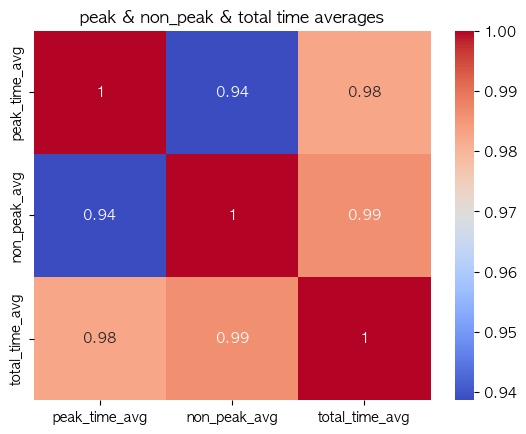

In [226]:
# heatmap 시각화

sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('peak & non_peak & total time averages')
plt.show()

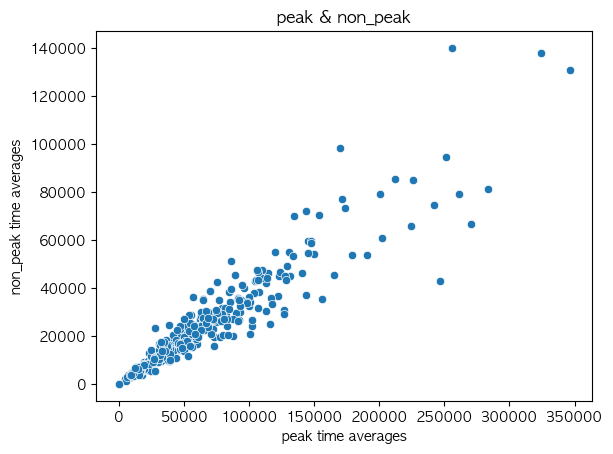

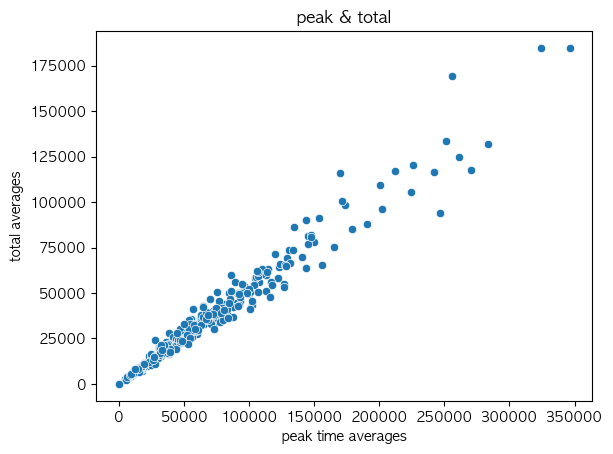

In [231]:
# 산점도 시각화

sns.scatterplot(data=line_peak_df, x='peak_time_avg', y='non_peak_avg')
plt.title('peak & non_peak')
plt.xlabel('peak time averages')
plt.ylabel('non_peak time averages')
plt.show()

sns.scatterplot(data=line_peak_df, x='peak_time_avg', y='total_time_avg')
plt.title('peak & total')
plt.xlabel('peak time averages')
plt.ylabel('total averages')
plt.show()


# < 상관관계 분석>

In [237]:
vs_df = line_peak_df.copy()
vs_df

peak_time_avg  non_peak_avg  total_time_avg
line_name station_name city                                             
1호선       동대문          종로구    38640.310185  24563.594136    28082.773148
          동묘앞          종로구    28041.731481  23146.550926    24370.346065
          서울           중구    225550.583333  85093.328704   120207.642361
          시청           중구    122178.310185  36697.240741    58067.508102
          신설동          동대문구   60531.703704  22795.259259    32229.370370
...                                    ...           ...             ...
일산선       지축           은평구        1.722222      0.722222        0.972222
중앙선       망우           동대문구   33436.060185  13582.361111    18545.785880
          상봉           중랑구    26900.283333  10427.522222    14545.712500
          양평           영등포구   12071.166667   6562.956790     7940.009259
          회기           동대문구  105948.472222  47580.257716    62172.311343

[366 rows x 3 columns]

## - 클러스터링 분석

In [ ]:
!pip3 install scikit-learn
from sklearn.cluster import KMeans

In [241]:
features = vs_df[['peak_time_avg', 'non_peak_avg' , 'total_time_avg']]
kmeans = KMeans(n_clusters=4, random_state=42)
vs_df['cluster'] = kmeans.fit_predict(features)

vs_df

peak_time_avg  non_peak_avg  total_time_avg  \
line_name station_name city                                                
1호선       동대문          종로구    38640.310185  24563.594136    28082.773148   
          동묘앞          종로구    28041.731481  23146.550926    24370.346065   
          서울           중구    225550.583333  85093.328704   120207.642361   
          시청           중구    122178.310185  36697.240741    58067.508102   
          신설동          동대문구   60531.703704  22795.259259    32229.370370   
...                                    ...           ...             ...   
일산선       지축           은평구        1.722222      0.722222        0.972222   
중앙선       망우           동대문구   33436.060185  13582.361111    18545.785880   
          상봉           중랑구    26900.283333  10427.522222    14545.712500   
          양평           영등포구   12071.166667   6562.956790     7940.009259   
          회기           동대문구  105948.472222  47580.257716    62172.311343   

                             cluster  
line_name station_name city           
1호선       동대문          종로구         1  
          동묘앞          종로구         1  
          서울           중구          2  
          시청           중구          0  
          신설동          동대문구        3  
...                              ...  
일산선       지축           은평구         1  
중앙선       망우           동대문구        1  
          상봉           중랑구         1  
          양평           영등포구        1  
          회기           동대문구        0  

[366 rows x 4 columns]

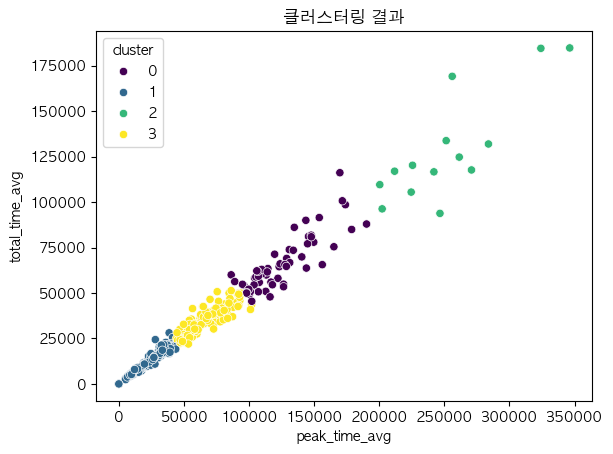

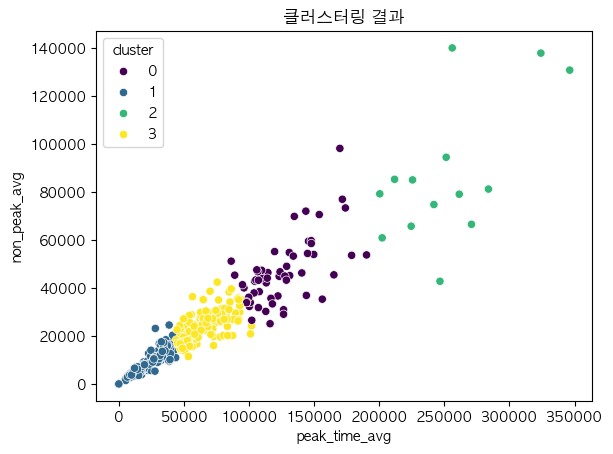

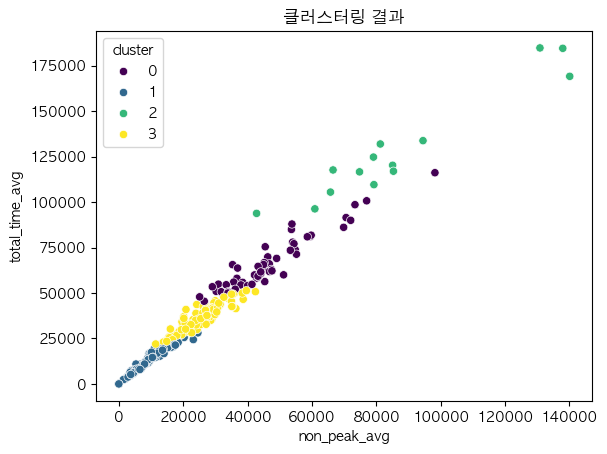

In [243]:
sns.scatterplot(data=vs_df, x='peak_time_avg', y='total_time_avg', hue='cluster', palette='viridis')
plt.title('클러스터링 결과')
plt.show()

sns.scatterplot(data=vs_df, x='peak_time_avg', y='non_peak_avg', hue='cluster', palette='viridis')
plt.title('클러스터링 결과')
plt.show()

sns.scatterplot(data=vs_df, x='non_peak_avg', y='total_time_avg', hue='cluster', palette='viridis')
plt.title('클러스터링 결과')
plt.show()

## - 히스토그램

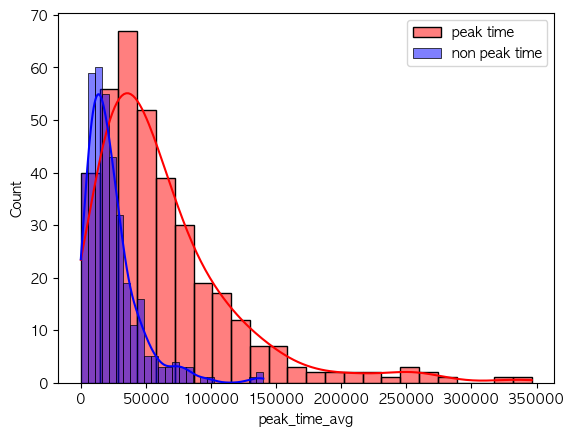

In [293]:
sns.histplot(vs_df['peak_time_avg'], color='red', kde=True, label='peak time')
sns.histplot(vs_df['non_peak_avg'], color='blue', kde=True, label='non peak time')
plt.legend(loc='best')
plt.show()

## - 지리적(공간적) 분석

In [295]:
filterd_merged_df.head(2)

,line_name,subway_station,averages,code,latitude,longitude
0,1호선,동대문,28082.773148,155.0,37.571420,127.009745
1,1호선,동묘앞,24370.346065,159.0,37.572627,127.016429


In [299]:
fillter_df = filterd_merged_df.rename(columns={'subway_station' : 'station_name'})
fillter_df.head(2)

,line_name,station_name,averages,code,latitude,longitude
0,1호선,동대문,28082.773148,155.0,37.571420,127.009745
1,1호선,동묘앞,24370.346065,159.0,37.572627,127.016429


In [296]:
vs_df.head(2)

peak_time_avg  non_peak_avg  total_time_avg  \
line_name station_name city                                                
1호선       동대문          종로구    38640.310185  24563.594136    28082.773148   
          동묘앞          종로구    28041.731481  23146.550926    24370.346065   

                             cluster  time_ratio  
line_name station_name city                       
1호선       동대문          종로구         1    1.573072  
          동묘앞          종로구         1    1.211486

In [300]:
vs_merged_df = pd.merge(fillter_df, vs_df, on=['line_name', 'station_name'], how='left')
vs_merged_df

,line_name,station_name,averages,code,latitude,longitude,peak_time_avg,non_peak_avg,total_time_avg,cluster,time_ratio
0,1호선,동대문,28082.773148,155.0,37.571420,127.009745,38640.310185,24563.594136,28082.773148,1,1.573072
1,1호선,동묘앞,24370.346065,159.0,37.572627,127.016429,28041.731481,23146.550926,24370.346065,1,1.211486
2,1호선,서울,120207.642361,150.0,37.554648,126.972559,225550.583333,85093.328704,120207.642361,2,2.650626
3,1호선,시청,58067.508102,151.0,37.564718,126.977108,122178.310185,36697.240741,58067.508102,0,3.329360
4,1호선,신설동,32229.370370,156.0,37.575297,127.025087,60531.703704,22795.259259,32229.370370,3,2.655451
...,...,...,...,...,...,...,...,...,...,...,...
310,우이신설선,솔밭공원,6003.879630,4702.0,37.656088,127.013252,10511.708333,4501.270062,6003.879630,1,2.335276
311,우이신설선,솔샘,13370.571759,4708.0,37.621240,127.013528,26082.083333,9133.401235,13370.571759,1,2.855681
312,우이신설선,신설동,5204.896991,4713.0,37.575297,127.025087,9702.185185,3705.800926,5204.896991,1,2.618107
313,우이신설선,정릉,10923.167824,4710.0,37.602798,127.013490,19676.800926,8005.290123,10923.167824,1,2.457975


In [311]:
# 지하철역 위경도에 혼잡도에 비례하는 반경을 표시하여 지도에 추가
spatial_map = new_seoul_map2
spatial_map

In [318]:
# 역 분포 지도에 표시
import folium

spatial_map = folium.Map(location=[37.5665, 126.9780], zoom_start=11)

for _, row in vs_merged_df.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=row['peak_time_avg'] / 10000,  # 혼잡도에 따라 원 크기 조정
        color='blue',
        fill=True,
        fill_opacity=0.7,
        popup=f"{row['station_name']} (Peak: {row['peak_time_avg']})"
    ).add_to(spatial_map)

spatial_map

# < tableau DataFrame>

In [58]:
tableau_df = origin_df.copy()

In [59]:
# 시간대별 체류인원 (승차인원 + 하차인원) 컬럼 추가

for col in tableau_df.columns :
    if '승차인원' in col :
        exit_col = col.replace('승차인원', '하차인원')
        if exit_col in tableau_df.columns :
            stay_col = col.replace('승차인원', 'passengers')
            tableau_df[stay_col] = tableau_df[col] + tableau_df[exit_col]

tableau_df.head(2)

,사용월,호선명,지하철역,행정구역,transfer_line,대합실면적,승강장면적,월일수,04시-05시 승차인원,04시-05시 하차인원,...,18시-19시 passengers,19시-20시 passengers,20시-21시 passengers,21시-22시 passengers,22시-23시 passengers,23시-24시 passengers,00시-01시 passengers,01시-02시 passengers,02시-03시 passengers,03시-04시 passengers
0,202111,우이신설선,4.19민주묘지,강북구,1.0,NaN,NaN,30,2,0,...,11217,9453,5773,4917,4159,2485,28,0,0,0
1,202112,우이신설선,4.19민주묘지,강북구,1.0,NaN,NaN,31,0,1,...,10614,8862,5897,5278,3839,1983,0,0,0,0


In [60]:
# 시간대별 일평균 인원 ( passengers / 월일수 ) 컬럼 생성

stay_columns = [col for col in tableau_df.columns if 'passengers' in col]

for col in stay_columns :
    new_col = col.replace('passengers', 'per_daily')
    tableau_df[new_col] = round(tableau_df[col] / tableau_df['월일수'], 2)

tableau_df.head(1)

,사용월,호선명,지하철역,행정구역,transfer_line,대합실면적,승강장면적,월일수,04시-05시 승차인원,04시-05시 하차인원,...,18시-19시 per_daily,19시-20시 per_daily,20시-21시 per_daily,21시-22시 per_daily,22시-23시 per_daily,23시-24시 per_daily,00시-01시 per_daily,01시-02시 per_daily,02시-03시 per_daily,03시-04시 per_daily
0,202111,우이신설선,4.19민주묘지,강북구,1.0,NaN,NaN,30,2,0,...,373.9,315.1,192.43,163.9,138.63,82.83,0.93,0.0,0.0,0.0


In [61]:
# 시간대별 congestion 컬럼 생성
con_columns = [ col for col in tableau_df.columns if 'per_daily' in col ]

for col in con_columns :
    congestion_col = col.replace('per_daily', 'congestion')
    tableau_df[congestion_col] = round( ((tableau_df[col] / tableau_df['승강장면적']) / 4.3 ) * 100, 2)

tableau_df.head(2)

,사용월,호선명,지하철역,행정구역,transfer_line,대합실면적,승강장면적,월일수,04시-05시 승차인원,04시-05시 하차인원,...,18시-19시 congestion,19시-20시 congestion,20시-21시 congestion,21시-22시 congestion,22시-23시 congestion,23시-24시 congestion,00시-01시 congestion,01시-02시 congestion,02시-03시 congestion,03시-04시 congestion
0,202111,우이신설선,4.19민주묘지,강북구,1.0,NaN,NaN,30,2,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,202112,우이신설선,4.19민주묘지,강북구,1.0,NaN,NaN,31,0,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [62]:
print(tableau_df.columns)

Index(['사용월', '호선명', '지하철역', '행정구역', 'transfer_line', '대합실면적', '승강장면적', '월일수',
       '04시-05시 승차인원', '04시-05시 하차인원',
       ...
       '18시-19시 congestion', '19시-20시 congestion', '20시-21시 congestion',
       '21시-22시 congestion', '22시-23시 congestion', '23시-24시 congestion',
       '00시-01시 congestion', '01시-02시 congestion', '02시-03시 congestion',
       '03시-04시 congestion'],
      dtype='object', length=153)


In [63]:
tableau_df.rename(columns={'지하철역' :'subway_station', '호선명' : 'line_name',
                           '사용월' : 'month', '행정구역' : 'city'}, inplace=True)
tableau_df.head(1)

,month,line_name,subway_station,city,transfer_line,대합실면적,승강장면적,월일수,04시-05시 승차인원,04시-05시 하차인원,...,18시-19시 congestion,19시-20시 congestion,20시-21시 congestion,21시-22시 congestion,22시-23시 congestion,23시-24시 congestion,00시-01시 congestion,01시-02시 congestion,02시-03시 congestion,03시-04시 congestion
0,202111,우이신설선,4.19민주묘지,강북구,1.0,NaN,NaN,30,2,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [64]:
con_columns = [ col for col in tableau_df.columns if 'congestion' in col ]

tableau_df['congestion_total'] = tableau_df[con_columns].sum(axis=1)
tableau_df.head(2)

,month,line_name,subway_station,city,transfer_line,대합실면적,승강장면적,월일수,04시-05시 승차인원,04시-05시 하차인원,...,19시-20시 congestion,20시-21시 congestion,21시-22시 congestion,22시-23시 congestion,23시-24시 congestion,00시-01시 congestion,01시-02시 congestion,02시-03시 congestion,03시-04시 congestion,congestion_total
0,202111,우이신설선,4.19민주묘지,강북구,1.0,NaN,NaN,30,2,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
1,202112,우이신설선,4.19민주묘지,강북구,1.0,NaN,NaN,31,0,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0


In [65]:
con_avg_columns = [ col for col in tableau_df.columns if 'congestion' in col ]

tableau_df['congestion_mean'] = tableau_df[con_columns].mean(axis=1)
tableau_df.head(2)

,month,line_name,subway_station,city,transfer_line,대합실면적,승강장면적,월일수,04시-05시 승차인원,04시-05시 하차인원,...,20시-21시 congestion,21시-22시 congestion,22시-23시 congestion,23시-24시 congestion,00시-01시 congestion,01시-02시 congestion,02시-03시 congestion,03시-04시 congestion,congestion_total,congestion_mean
0,202111,우이신설선,4.19민주묘지,강북구,1.0,NaN,NaN,30,2,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN
1,202112,우이신설선,4.19민주묘지,강북구,1.0,NaN,NaN,31,0,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN


In [66]:
in_columns = [ col for col in tableau_df.columns if '승차인원' in col ]

tableau_df['get_in_total'] = tableau_df[in_columns].sum(axis=1)
tableau_df.head(2)

,month,line_name,subway_station,city,transfer_line,대합실면적,승강장면적,월일수,04시-05시 승차인원,04시-05시 하차인원,...,21시-22시 congestion,22시-23시 congestion,23시-24시 congestion,00시-01시 congestion,01시-02시 congestion,02시-03시 congestion,03시-04시 congestion,congestion_total,congestion_mean,get_in_total
0,202111,우이신설선,4.19민주묘지,강북구,1.0,NaN,NaN,30,2,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,83041
1,202112,우이신설선,4.19민주묘지,강북구,1.0,NaN,NaN,31,0,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,76995


In [67]:
out_columns = [ col for col in tableau_df.columns if '하차인원' in col ]

tableau_df['get_out_total'] = tableau_df[out_columns].sum(axis=1)
tableau_df.head(2)

,month,line_name,subway_station,city,transfer_line,대합실면적,승강장면적,월일수,04시-05시 승차인원,04시-05시 하차인원,...,22시-23시 congestion,23시-24시 congestion,00시-01시 congestion,01시-02시 congestion,02시-03시 congestion,03시-04시 congestion,congestion_total,congestion_mean,get_in_total,get_out_total
0,202111,우이신설선,4.19민주묘지,강북구,1.0,NaN,NaN,30,2,0,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,83041,77394
1,202112,우이신설선,4.19민주묘지,강북구,1.0,NaN,NaN,31,0,1,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,76995,72576


In [68]:
tableau_df['year'] = pd.to_datetime(tableau_df['month'], format='%Y%m').dt.year
tableau_df.head(1)

,month,line_name,subway_station,city,transfer_line,대합실면적,승강장면적,월일수,04시-05시 승차인원,04시-05시 하차인원,...,23시-24시 congestion,00시-01시 congestion,01시-02시 congestion,02시-03시 congestion,03시-04시 congestion,congestion_total,congestion_mean,get_in_total,get_out_total,year
0,202111,우이신설선,4.19민주묘지,강북구,1.0,NaN,NaN,30,2,0,...,NaN,NaN,NaN,NaN,NaN,0.0,NaN,83041,77394,2021


In [69]:
peak_times = ['07시-08시 passengers', '08시-09시 passengers', '09시-10시 passengers',
              '17시-18시 passengers', '18시-19시 passengers', '19시-20시 passengers']
non_peak_times = [col for col in tableau_df.columns if 'passengers' in col and col not in peak_times]
stay_columns = [col for col in tableau_df.columns if 'passengers' in col]

tableau_df['peak_time_passengers_total'] = tableau_df[peak_times].sum(axis=1)
tableau_df['non_peak_time_passengers_total'] = tableau_df[non_peak_times].sum(axis=1)
tableau_df['passengers_total'] = tableau_df[stay_columns].sum(axis=1)


tableau_df.head(1)

,month,line_name,subway_station,city,transfer_line,대합실면적,승강장면적,월일수,04시-05시 승차인원,04시-05시 하차인원,...,02시-03시 congestion,03시-04시 congestion,congestion_total,congestion_mean,get_in_total,get_out_total,year,peak_time_passengers_total,non_peak_time_passengers_total,passengers_total
0,202111,우이신설선,4.19민주묘지,강북구,1.0,NaN,NaN,30,2,0,...,NaN,NaN,0.0,NaN,83041,77394,2021,67207,93228,160435


In [70]:
tableau_df['peak_time_mean'] = tableau_df[peak_times].mean(axis=1)
tableau_df['non_peak_time_mean'] = tableau_df[non_peak_times].mean(axis=1)
tableau_df['passengers_mean'] = tableau_df[stay_columns].mean(axis=1)

tableau_df.head(1)

,month,line_name,subway_station,city,transfer_line,대합실면적,승강장면적,월일수,04시-05시 승차인원,04시-05시 하차인원,...,congestion_mean,get_in_total,get_out_total,year,peak_time_passengers_total,non_peak_time_passengers_total,passengers_total,peak_time_mean,non_peak_time_mean,passengers_mean
0,202111,우이신설선,4.19민주묘지,강북구,1.0,NaN,NaN,30,2,0,...,NaN,83041,77394,2021,67207,93228,160435,11201.166667,5179.333333,6684.791667


In [71]:
select_columns = ['month', 'year', 'line_name', 'subway_station', 'city', 'transfer_line',
                  '대합실면적', '승강장면적', 'congestion_total', 'congestion_mean', 'get_in_total', 'get_out_total',
                  'peak_time_passengers_total', 'non_peak_time_passengers_total','passengers_total',
                  'peak_time_mean', 'non_peak_time_mean', 'passengers_mean']

tableau_selected_df = tableau_df[select_columns]

tableau_selected_df.head(1)

,month,year,line_name,subway_station,city,transfer_line,대합실면적,승강장면적,congestion_total,congestion_mean,get_in_total,get_out_total,peak_time_passengers_total,non_peak_time_passengers_total,passengers_total,peak_time_mean,non_peak_time_mean,passengers_mean
0,202111,2021,우이신설선,4.19민주묘지,강북구,1.0,NaN,NaN,0.0,NaN,83041,77394,67207,93228,160435,11201.166667,5179.333333,6684.791667


In [72]:
merge_coordinate_df = coordinate_df.drop(columns=['code'])
merge_coordinate_df.head(3)

,line_name,subway_station,latitude,longitude
0,1호선,녹양,37.759380,127.042292
1,1호선,남영,37.541021,126.971300
2,1호선,용산,37.529849,126.964561


In [ ]:
37.525581 126.886296

In [73]:
merge_coordinate_df[merge_coordinate_df['subway_station'] == '양평']

,line_name,subway_station,latitude,longitude
263,5호선,양평,37.492832,127.491814
472,경의선,양평,37.492832,127.491814


In [74]:
merge_coordinate_df.loc[263,'latitude'] = 37.525581
merge_coordinate_df.loc[472,'latitude'] = 37.525581
merge_coordinate_df.loc[263,'longitude'] = 126.886296
merge_coordinate_df.loc[472,'longitude'] = 126.886296


In [75]:
tableau_merged_df = pd.merge(tableau_selected_df, merge_coordinate_df, on=['line_name','subway_station'], how='left')
tableau_merged_df.head(1)

,month,year,line_name,subway_station,city,transfer_line,대합실면적,승강장면적,congestion_total,congestion_mean,get_in_total,get_out_total,peak_time_passengers_total,non_peak_time_passengers_total,passengers_total,peak_time_mean,non_peak_time_mean,passengers_mean,latitude,longitude
0,202111,2021,우이신설선,4.19민주묘지,강북구,1.0,NaN,NaN,0.0,NaN,83041,77394,67207,93228,160435,11201.166667,5179.333333,6684.791667,NaN,NaN


In [416]:
tableau_merged_df['city'].unique()

array(['강북구', '송파구', '금천구', '강서구', '서대문구', '강남구', '강동구', '광진구', '종로구',
       '성북구', '서초구', '마포구', '노원구', '구로구', '은평구', '영등포구', '성동구', '관악구',
       '동작구', '용산구', '도봉구', '중구', '동대문구', '중랑구', '양천구'], dtype=object)

In [444]:
tableau_merged_df.head(2)

,month,line_name,subway_station,city,transfer_line,대합실면적,승강장면적,congestion_total,congestion_mean,get_in_total,get_out_total,peak_time_passengers_total,non_peak_time_passengers_total,passengers_total,peak_time_mean,non_peak_time_mean,passengers_mean,latitude,longitude
0,202111,우이신설선,4.19민주묘지,강북구,1.0,NaN,NaN,0.0,NaN,83041,77394,67207,93228,160435,11201.166667,5179.333333,6684.791667,NaN,NaN
1,202112,우이신설선,4.19민주묘지,강북구,1.0,NaN,NaN,0.0,NaN,76995,72576,62486,87085,149571,10414.333333,4838.055556,6232.125000,NaN,NaN


In [445]:
tableau_merged_df.to_csv('./rawdata/tableau_merged_df.csv')

In [76]:
tableau_merged_df.to_excel('./rawdata/tableau_merged_df.xlsx')